<a href="https://colab.research.google.com/github/jacobholmshaw/biological-image-classification/blob/main/error_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [ ]:
pip install git+https://github.com/aleju/imgaug.git

  Cloning https://github.com/aleju/imgaug.git to /tmp/pip-req-build-bocp64n7
  Running command git clone -q https://github.com/aleju/imgaug.git /tmp/pip-req-build-bocp64n7


In [ ]:
# Tensorflow libraries
import tensorflow as tf  # version 2.5
from tensorflow import keras
from tensorflow.keras.layers import LeakyReLU, Softmax
from tensorflow.keras.layers import Conv2D, MaxPooling2D, SeparableConv2D
from tensorflow.keras.layers import Dense, Flatten, Dropout, Reshape, Activation
from tensorflow.keras.layers import InputLayer, Input
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import LSTM
from tensorflow.keras.optimizers import Adam, Adagrad, Adadelta, Adamax, SGD, Ftrl, Nadam, RMSprop
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras import backend as K
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import Sequential
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
# General
import numpy as np
import math
%matplotlib inline
import matplotlib.pyplot as plt
from pathlib import Path
import random
import cv2
import imutils

In [ ]:
from google.colab import drive
import os
drive.mount('/content/drive/', force_remount=True)

os.chdir(os.getcwd()+'/drive/MyDrive/Hypothalamus machine learning/Data')
path = os.getcwd()

import sys
sys.path.append('/content/drive/MyDrive/Hypothalamus machine learning/Code')
from augfunctions import create_folders, create_directory, create_training_data, data, run_model, visualize

Mounted at /content/drive/


In [ ]:
path = os.getcwd()
DATADIR = path+'/labeled_data'

# The following methods don't work with the DATADIR as a string, therefore we convert it to a path using Path from pathlib
from pathlib import Path
DATADIR = Path(DATADIR)

#Sub directories for different categories
CATEGORIES = ["10_1","10_2","10_3"]

print('Path:', path)
print('Data directory:', DATADIR)

parent = os.path.join(path, os.pardir)
modelDIR = os.path.abspath(parent) + '/Models'
plotDIR = os.path.abspath(parent) + '/Plots/augmentation_acc_loss_plots'
# prints parent directory
print("\nParent Directory:", os.path.abspath(parent))
print("Model directory:", modelDIR)
print("Plots directory:", plotDIR)

optDIR = os.path.abspath(parent) + '/opt'
print('Optimisation directory:', optDIR)

Path: /content/drive/.shortcut-targets-by-id/1ZbnJPWEDz_tPFpcEvBWPaS5XZIuj7-E3/Hypothalamus machine learning/Data
Data directory: /content/drive/.shortcut-targets-by-id/1ZbnJPWEDz_tPFpcEvBWPaS5XZIuj7-E3/Hypothalamus machine learning/Data/labeled_data

Parent Directory: /content/drive/.shortcut-targets-by-id/1ZbnJPWEDz_tPFpcEvBWPaS5XZIuj7-E3/Hypothalamus machine learning
Model directory: /content/drive/.shortcut-targets-by-id/1ZbnJPWEDz_tPFpcEvBWPaS5XZIuj7-E3/Hypothalamus machine learning/Models
Plots directory: /content/drive/.shortcut-targets-by-id/1ZbnJPWEDz_tPFpcEvBWPaS5XZIuj7-E3/Hypothalamus machine learning/Plots/augmentation_acc_loss_plots
Optimisation directory: /content/drive/.shortcut-targets-by-id/1ZbnJPWEDz_tPFpcEvBWPaS5XZIuj7-E3/Hypothalamus machine learning/opt


# Good split

## Importing good split data

In [ ]:
import zipfile
!unzip '/content/test_rot.zip'

Archive:  /content/test_rot.zip
replace test_rot/train/10_1/325test_rot10.1_004.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
import tqdm
def create_training_data(directory_name, train = False, val = False, test = False):
    training_data = []
    val_data = []
    test_data = []
    for category in CATEGORIES:  # 10_1, 10_2, 10_3

        path = os.path.join(directory_name,category) 
        class_num = CATEGORIES.index(category)  # get the label  (0, 1 or 2)

        for img in tqdm.tqdm(os.listdir(path)):  # iterate over each image
            try:
                img_array = cv2.imread(os.path.join(path,img), cv2.IMREAD_GRAYSCALE) 
                if train == True:
                  training_data.append([cv2.resize(img_array, (200, 200)), class_num])
                if val == True:
                  val_data.append([cv2.resize(img_array, (200, 200)), class_num])
                if test == True:
                  test_data.append([cv2.resize(img_array, (200, 200)), class_num])
            except Exception as e:  
                pass

    if train == True:
      return training_data

    if val == True:
      return val_data

    if test == True:
      return test_data

In [ ]:
training_data = create_training_data('test_rot/train', train = True)
val_data = create_training_data('test_rot/val', val = True)
#test_data = create_training_data(path + '/test', test = True)

100%|██████████| 576/576 [00:02<00:00, 280.03it/s]


## Create model function

In [ ]:
from keras import regularizers
from tensorflow.keras import layers
def create_model(optimizer,
                 learning_rate,
                 layer_drop,
                 final_drop,
                 activation,
                 lamda):

  lamda = lamda
  # model = Sequential()

  # model.add(InputLayer(input_shape=(200, 200, 1)))

  # for i in range(num_conv_layers):
  #   name = 'layer_conv_{}'.format(i+1)
  #   model.add(Conv2D(num_conv_nodes*(2**i),
  #                    3,
  #                    padding = 'same',
  #                    activation = 'relu',
  #                    kernel_regularizer = regularizers.l2(lamda),
  #                    name = name))
  #   model.add(Dropout(layer_drop))
  #   model.add(MaxPooling2D(pool_size = 2,
  #                          strides = 2,
  #                          padding = 'same'))
  

  # model.add(Flatten())
  # model.add(Dense(512,
  #                 activation = 'relu'))
  # model.add(Dropout(final_drop))
  # model.add(Dense(3,
  #                 activation = 'softmax'))
  
  if optimizer == 'adam':
    optimizer = Adam(learning_rate = learning_rate)
  
  if optimizer == 'adagrad':
    optimizer = Adagrad(learning_rate = learning_rate)

  if optimizer == 'RMSprop':
    optimizer = RMSprop(learning_rate = learning_rate)

  if optimizer == 'adadelta':
    optimizer = Adadelta(learning_rate = learning_rate)
  
  if optimizer == 'adamax':
    optimizer = Adamax(learning_rate = learning_rate)

  if optimizer == 'SGD':
    optimizer = SGD(learning_rate = learning_rate)

  model = Sequential([
    layers.Conv2D(16, 3, padding='same', activation= activation, input_shape = (200, 200, 1), kernel_regularizer=regularizers.l2(lamda)),
    layers.Dropout(layer_drop),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
    layers.Dropout(layer_drop),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
    layers.Dropout(layer_drop),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
    layers.Dropout(layer_drop),
    layers.MaxPooling2D(),
    layers.Conv2D(256, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
    layers.Dropout(layer_drop),
    layers.MaxPooling2D(),
    layers.Conv2D(512, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
    layers.Dropout(layer_drop),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(512, activation=activation),
    layers.Dropout(final_drop),
    layers.Dense(3, activation = 'softmax')
  ])
  #opt = Adam(learning_rate = learning_rate)
  model.compile(optimizer = optimizer,
                loss = 'categorical_crossentropy',
                metrics = ['accuracy'])
    
  return model

## Running the model

In [ ]:
random.shuffle(training_data)
random.shuffle(val_data)
random.shuffle(test_data)

# Preprocessing the data into X_train etc with relevant input shapes
X_train = []
y_train = []
X_val = []
y_val = []
X_test = []
y_test = []
img_size = 200

for feature, label in training_data:
  X_train.append(feature)
  y_train.append(label)

for feature, label in val_data:
  X_val.append(feature)
  y_val.append(label)

for feature, label in test_data:
  X_test.append(feature)
  y_test.append(label)

X_train = np.array(X_train) / 255
X_val = np.array(X_val) / 255
X_test = np.array(X_test) / 255

X_train = X_train.reshape(X_train.shape[0], 200, 200, 1)
X_val = X_val.reshape(X_val.shape[0], 200, 200, 1)
X_test = X_test.reshape(X_test.shape[0], 200, 200, 1)

X_train.astype('float32')
X_val.astype('float32')
X_test.astype('float32')

y_train=to_categorical(y_train)
y_val=to_categorical(y_val)
y_test = to_categorical(y_test)

print('X_train shape should be:', 0.7*(len(training_data) + len(test_data) + len(val_data)))
print('X_train shape:', np.shape(X_train))
print('X_val and X_test shapes should be:', 0.15*(len(training_data) + len(test_data) + len(val_data)))
print('X_val shape:', np.shape(X_val))
print('X_test shape:', np.shape(X_test))
print('y_train shape:', np.shape(y_train))
print('y_val shape:', np.shape(y_val))
print('y_test shape:', np.shape(y_test))


In [ ]:


model = create_model(optimizer = 'adam',
                      learning_rate = 0.0001,
                      layer_drop = 0.2,
                      final_drop = 0.5,
                      activation = 'relu',
                      lamda = 0.001)

earlyStop = EarlyStopping(monitor = 'val_loss', min_delta = 0.01, patience = 5)

# callbacks_list = [callback_log, earlyStop]

history = model.fit(x=X_train,
                    y=y_train,
                    epochs=50,
                    batch_size=32,
                    validation_data=(X_val, y_val),
                    callbacks=[earlyStop])


Epoch 1/50
253/253 [==============================] - 7s 25ms/step - loss: 1.5359 - accuracy: 0.4497 - val_loss: 1.4385 - val_accuracy: 0.4208
Epoch 2/50
253/253 [==============================] - 6s 23ms/step - loss: 1.2805 - accuracy: 0.5216 - val_loss: 1.3158 - val_accuracy: 0.4708
Epoch 3/50
253/253 [==============================] - 6s 23ms/step - loss: 1.1296 - accuracy: 0.5750 - val_loss: 1.2192 - val_accuracy: 0.5042
Epoch 4/50
253/253 [==============================] - 6s 23ms/step - loss: 0.9668 - accuracy: 0.6723 - val_loss: 1.1215 - val_accuracy: 0.6074
Epoch 5/50
253/253 [==============================] - 6s 23ms/step - loss: 0.7923 - accuracy: 0.7730 - val_loss: 1.0590 - val_accuracy: 0.6157
Epoch 6/50
253/253 [==============================] - 6s 23ms/step - loss: 0.6445 - accuracy: 0.8371 - val_loss: 1.0480 - val_accuracy: 0.6611
Epoch 7/50
253/253 [==============================] - 6s 23ms/step - loss: 0.5243 - accuracy: 0.8904 - val_loss: 0.8775 - val_accuracy: 0.7611

In [ ]:
trainclasses = []
for i in range(8065):
  trainclasses.append(np.where(y_train[i]==1))
trainclasses = np.concatenate(trainclasses)
print('Number of 10.1s:', sum(trainclasses == 0))
print('Number of 10.2s:', sum(trainclasses == 1))
print('Number of 10.3s:', sum(trainclasses == 2))

Number of 10.1s: [2881]
Number of 10.2s: [2952]
Number of 10.3s: [2232]


In [ ]:
valclasses = []
for i in range(2160):
  valclasses.append(np.where(y_val[i]==1))
valclasses = np.concatenate(valclasses)
print('Number of 10.1s:', sum(valclasses == 0))
print('Number of 10.2s:', sum(valclasses == 1))
print('Number of 10.3s:', sum(valclasses == 2))

Number of 10.1s: [792]
Number of 10.2s: [792]
Number of 10.3s: [576]


Number of 10.1s: [2]
Number of 10.2s: [24]
Number of 10.3s: [22]
Percetage of 10.1s less than 0.5 [0.00325733]
Percetage of 10.2s less than 0.5 [0.04130809]
Percetage of 10.3s less than 0.5 [0.04772234]


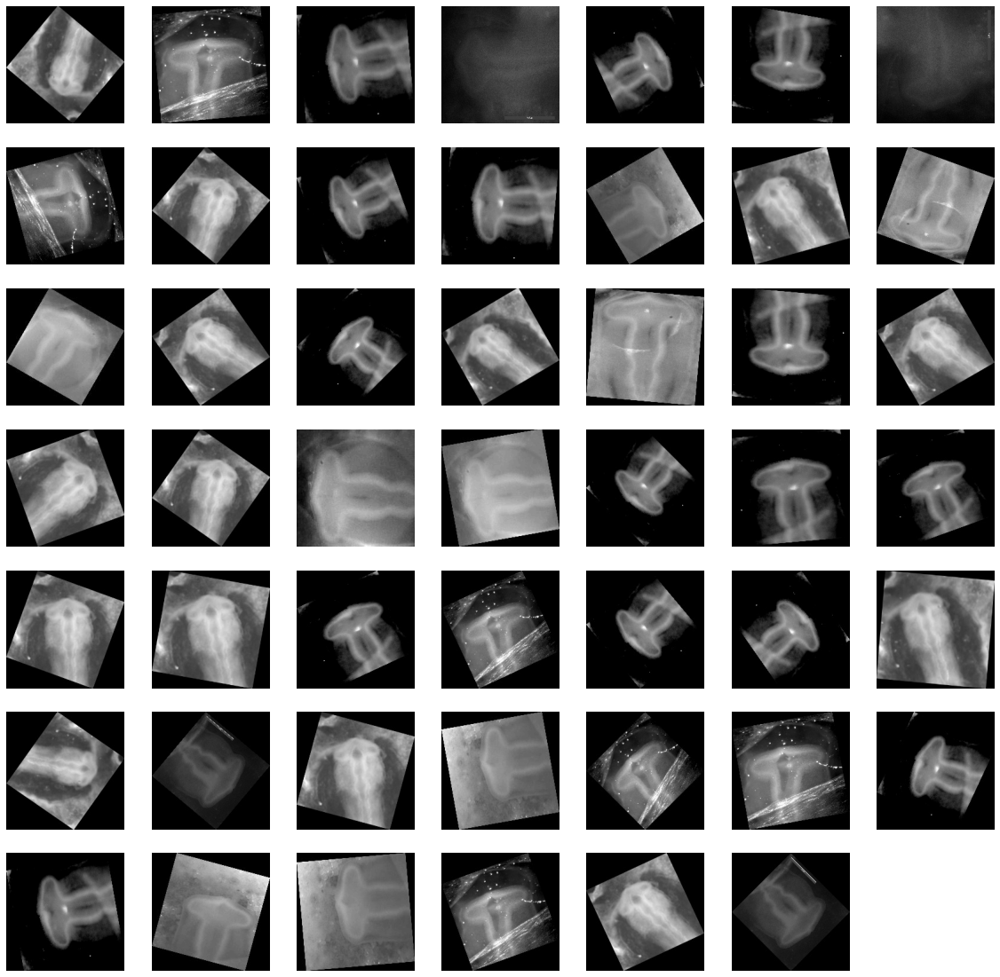

In [ ]:
fig = plt.figure(figsize=(20, 20))
results = model.predict(X_val)
nums = []
classes = []
for i in range(np.shape(X_val)[0]):
  nums.append(max(list(results[i])))
id = []
for num in nums:
  if num < 0.5:
    id.append(nums.index(num))
images = []
for i in id:
  images.append(val_data[i][0])
  classes.append(np.where(y_val[i]==1))
for i in range(len(images)):
  plt.subplot((int(math.ceil(np.sqrt(len(id))))), 
              (int(math.ceil(np.sqrt(len(id))))), 
              i+1)
  plt.imshow(images[i], cmap = 'gray')
  plt.axis('off')
classes = np.concatenate(classes)
print('Number of 10.1s:', sum(classes == 0))
print('Number of 10.2s:', sum(classes == 1))
print('Number of 10.3s:', sum(classes == 2))
print('Percetage of 10.1s less than 0.5', sum(classes == 0)/sum(valclasses == 0))
print('Percetage of 10.2s less than 0.5', sum(classes == 1)/sum(valclasses == 1))
print('Percetage of 10.3s less than 0.5', sum(classes == 2)/sum(valclasses == 2))

Number of 10.1s: [494]
Number of 10.2s: [401]
Number of 10.3s: [123]
Percetage of 10.1s more than 0.9 [0.80456026]
Percetage of 10.2s more than 0.9 [0.69018933]
Percetage of 10.3s more than 0.9 [0.26681128]


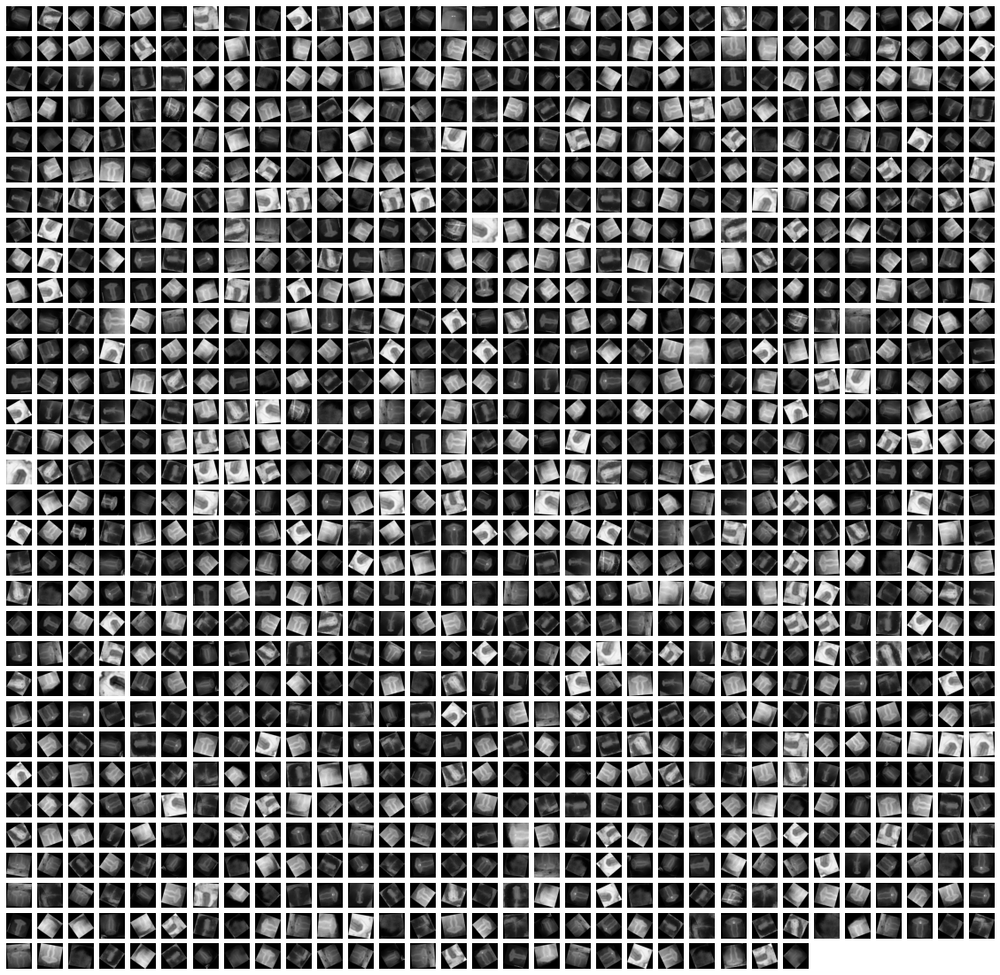

In [ ]:
fig = plt.figure(figsize=(20, 20))
results = model.predict(X_val)
nums = []
classes = []
for i in range(np.shape(X_val)[0]):
  nums.append(max(list(results[i])))
id = []
for num in nums:
  if num > 0.9:
    id.append(nums.index(num))
images = []
for i in id:
  images.append(val_data[i][0])
  classes.append(np.where(y_val[i]==1))
for i in range(len(images)):
  plt.subplot((int(math.ceil(np.sqrt(len(id))))), 
              (int(math.ceil(np.sqrt(len(id))))), 
              i+1)
  plt.imshow(images[i], cmap = 'gray')
  plt.axis('off')
classes = np.concatenate(classes)
print('Number of 10.1s:', sum(classes == 0))
print('Number of 10.2s:', sum(classes == 1))
print('Number of 10.3s:', sum(classes == 2))
print('Percetage of 10.1s more than 0.9', sum(classes == 0)/sum(valclasses == 0))
print('Percetage of 10.2s more than 0.9', sum(classes == 1)/sum(valclasses == 1))
print('Percetage of 10.3s more than 0.9', sum(classes == 2)/sum(valclasses == 2))

One clear thing in the above images is that the ones classified with a probability of less than 40% are those that either are too dark or too bright, therefore adjusting brightness may improve the classifier.

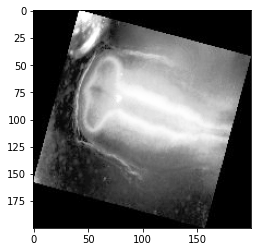

In [ ]:
img = val_data[269][0]
aug = cv2.equalizeHist(val_data[0][0])
plt.imshow(aug, cmap = 'gray')

In [ ]:
train2 = []
for feature, label in training_data:
  feature = cv2.equalizeHist(feature)
  train2.append([feature, label])  

In [ ]:
val2 = []
for feature, label in val_data:
  feature = cv2.equalizeHist(feature)
  val2.append([feature, label])  

In [ ]:
random.shuffle(train2)
random.shuffle(val2)
random.shuffle(test_data)

# Preprocessing the data into X_train etc with relevant input shapes
X_train = []
y_train = []
X_val = []
y_val = []
X_test = []
y_test = []
img_size = 200

for feature, label in train2:
  X_train.append(feature)
  y_train.append(label)

for feature, label in val2:
  X_val.append(feature)
  y_val.append(label)

for feature, label in test_data:
  X_test.append(feature)
  y_test.append(label)

X_train = np.array(X_train) / 255
X_val = np.array(X_val) / 255
X_test = np.array(X_test) / 255

X_train = X_train.reshape(X_train.shape[0], 200, 200, 1)
X_val = X_val.reshape(X_val.shape[0], 200, 200, 1)
X_test = X_test.reshape(X_test.shape[0], 200, 200, 1)

X_train.astype('float32')
X_val.astype('float32')
X_test.astype('float32')

y_train=to_categorical(y_train)
y_val=to_categorical(y_val)
y_test = to_categorical(y_test)

print('X_train shape:', np.shape(X_train))
print('X_val shape:', np.shape(X_val))
print('X_test shape:', np.shape(X_test))
print('y_train shape:', np.shape(y_train))
print('y_val shape:', np.shape(y_val))
print('y_test shape:', np.shape(y_test))


X_train shape: (8065, 200, 200, 1)
X_val shape: (2160, 200, 200, 1)
X_test shape: (9, 200, 200, 1)
y_train shape: (8065, 3)
y_val shape: (2160, 3)
y_test shape: (9, 3)


In [ ]:


model = create_model(optimizer = 'adam',
                      learning_rate = 0.0001,
                      layer_drop = 0.2,
                      final_drop = 0.5,
                      activation = 'relu',
                      lamda = 0.001)

earlyStop = EarlyStopping(monitor = 'val_loss', min_delta = 0.01, patience = 5)

# callbacks_list = [callback_log, earlyStop]

history = model.fit(x=X_train,
                    y=y_train,
                    epochs=50,
                    batch_size=32,
                    validation_data=(X_val, y_val),
                    callbacks=[earlyStop])


Epoch 1/50
253/253 [==============================] - 8s 30ms/step - loss: 1.5599 - accuracy: 0.4122 - val_loss: 1.4876 - val_accuracy: 0.3032
Epoch 2/50
253/253 [==============================] - 6s 23ms/step - loss: 1.3219 - accuracy: 0.5128 - val_loss: 1.3738 - val_accuracy: 0.3944
Epoch 3/50
253/253 [==============================] - 6s 23ms/step - loss: 1.1928 - accuracy: 0.5810 - val_loss: 1.3108 - val_accuracy: 0.4366
Epoch 4/50
253/253 [==============================] - 6s 23ms/step - loss: 1.0151 - accuracy: 0.6786 - val_loss: 1.2439 - val_accuracy: 0.4736
Epoch 5/50
253/253 [==============================] - 6s 23ms/step - loss: 0.8419 - accuracy: 0.7561 - val_loss: 1.1072 - val_accuracy: 0.6222
Epoch 6/50
253/253 [==============================] - 6s 23ms/step - loss: 0.6284 - accuracy: 0.8558 - val_loss: 0.9952 - val_accuracy: 0.7347
Epoch 7/50
253/253 [==============================] - 6s 23ms/step - loss: 0.4591 - accuracy: 0.9283 - val_loss: 0.8594 - val_accuracy: 0.8366

In [ ]:
trainclasses = []
for i in range(8065):
  trainclasses.append(np.where(y_train[i]==1))
trainclasses = np.concatenate(trainclasses)
print('Number of 10.1s:', sum(trainclasses == 0))
print('Number of 10.2s:', sum(trainclasses == 1))
print('Number of 10.3s:', sum(trainclasses == 2))

Number of 10.1s: [2881]
Number of 10.2s: [2952]
Number of 10.3s: [2232]


In [ ]:
valclasses = []
for i in range(2160):
  valclasses.append(np.where(y_val[i]==1))
valclasses = np.concatenate(valclasses)
print('Number of 10.1s:', sum(valclasses == 0))
print('Number of 10.2s:', sum(valclasses == 1))
print('Number of 10.3s:', sum(valclasses == 2))

Number of 10.1s: [792]
Number of 10.2s: [792]
Number of 10.3s: [576]


Number of 10.1s: [27]
Number of 10.2s: [24]
Number of 10.3s: [19]
Percetage of 10.1s less than 0.5 [0.03409091]
Percetage of 10.2s less than 0.5 [0.03030303]
Percetage of 10.3s less than 0.5 [0.03298611]


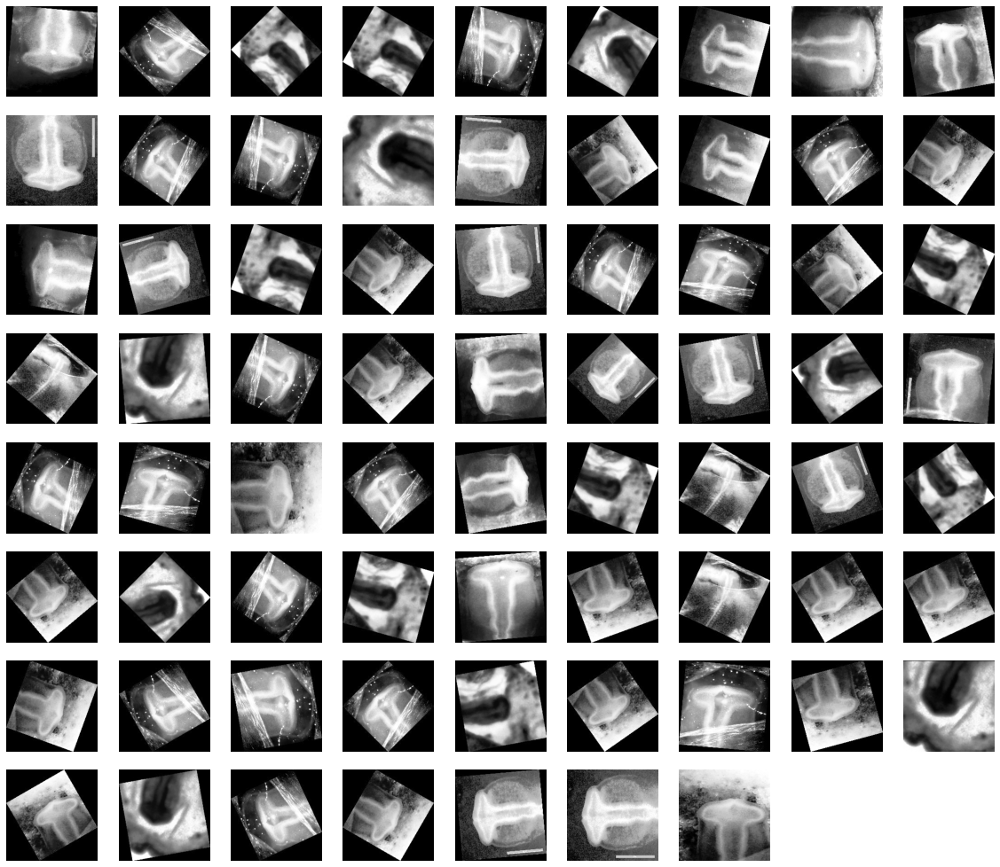

In [ ]:
fig = plt.figure(figsize=(20, 20))
results = model.predict(X_val)
nums = []
classes = []
for i in range(np.shape(X_val)[0]):
  nums.append(max(list(results[i])))
id = []
for num in nums:
  if num <0.5:
    id.append(nums.index(num))
images = []
for i in id:
  images.append(val2[i][0])
  classes.append(np.where(y_val[i]==1))
for i in range(len(images)):
  plt.subplot((int(math.ceil(np.sqrt(len(id))))), 
              (int(math.ceil(np.sqrt(len(id))))), 
              i+1)
  plt.imshow(images[i], cmap = 'gray')
  plt.axis('off')
classes = np.concatenate(classes)
print('Number of 10.1s:', sum(classes == 0))
print('Number of 10.2s:', sum(classes == 1))
print('Number of 10.3s:', sum(classes == 2))
print('Percetage of 10.1s less than 0.5', sum(classes == 0)/sum(valclasses == 0))
print('Percetage of 10.2s less than 0.5', sum(classes == 1)/sum(valclasses == 1))
print('Percetage of 10.3s less than 0.5', sum(classes == 2)/sum(valclasses == 2))

Number of 10.1s: [358]
Number of 10.2s: [152]
Number of 10.3s: [414]
Percetage of 10.1s more than 0.9 [0.4520202]
Percetage of 10.2s more than 0.9 [0.19191919]
Percetage of 10.3s more than 0.9 [0.71875]


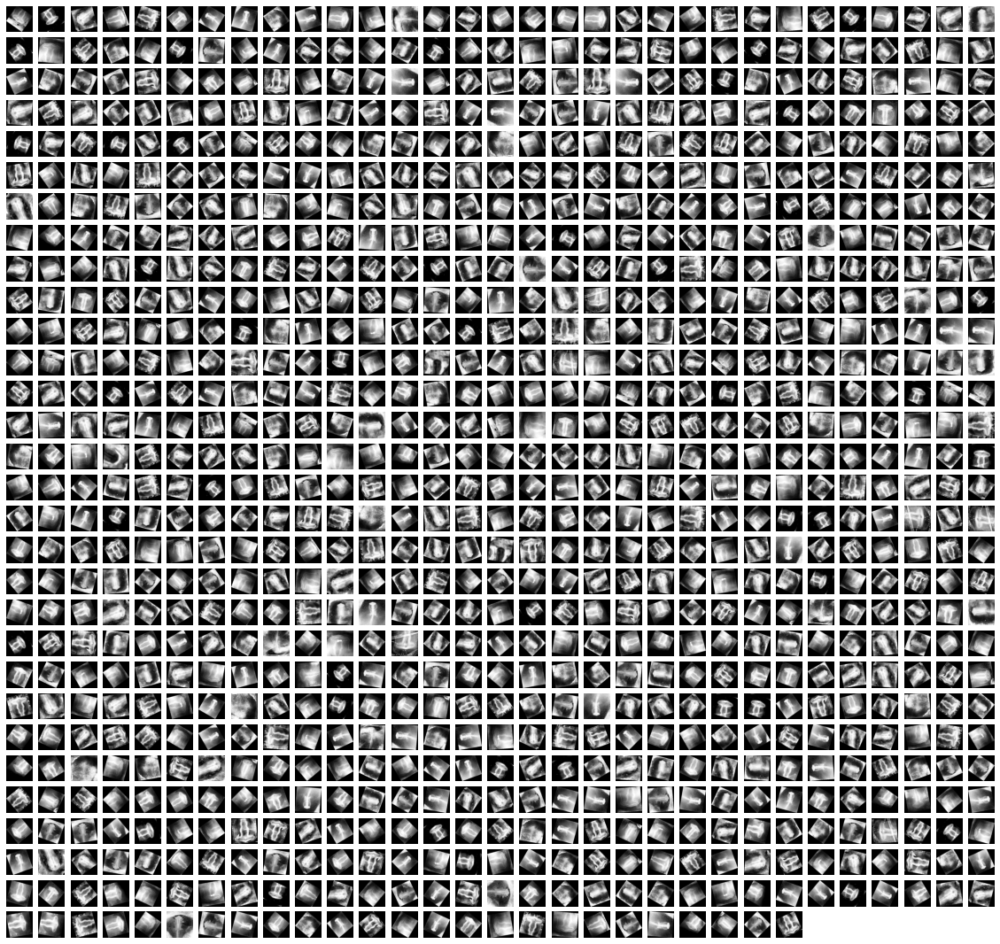

In [ ]:
fig = plt.figure(figsize=(20, 20))
results = model.predict(X_val)
nums = []
classes = []
for i in range(np.shape(X_val)[0]):
  nums.append(max(list(results[i])))
id = []
for num in nums:
  if num >0.9:
    id.append(nums.index(num))
images = []
for i in id:
  images.append(val2[i][0])
  classes.append(np.where(y_val[i]==1))
for i in range(len(images)):
  plt.subplot((int(math.ceil(np.sqrt(len(id))))), 
              (int(math.ceil(np.sqrt(len(id))))), 
              i+1)
  plt.imshow(images[i], cmap = 'gray')
  plt.axis('off')
classes = np.concatenate(classes)
print('Number of 10.1s:', sum(classes == 0))
print('Number of 10.2s:', sum(classes == 1))
print('Number of 10.3s:', sum(classes == 2))
print('Percetage of 10.1s more than 0.9', sum(classes == 0)/sum(valclasses == 0))
print('Percetage of 10.2s more than 0.9', sum(classes == 1)/sum(valclasses == 1))
print('Percetage of 10.3s more than 0.9', sum(classes == 2)/sum(valclasses == 2))

## Applying hist only to 10.3s

In [ ]:
train3 = []
for feature, label in training_data:
  if label == 2:
    feature = cv2.equalizeHist(feature)
  train3.append([feature, label])

In [ ]:
val3 = []
for feature, label in val_data:
  if label == 2:
    feature = cv2.equalizeHist(feature)
  val3.append([feature, label])  

In [ ]:
random.shuffle(train3)
random.shuffle(val3)
random.shuffle(test_data)

# Preprocessing the data into X_train etc with relevant input shapes
X_train = []
y_train = []
X_val = []
y_val = []
X_test = []
y_test = []
img_size = 200

for feature, label in train3:
  X_train.append(feature)
  y_train.append(label)

for feature, label in val3:
  X_val.append(feature)
  y_val.append(label)

for feature, label in test_data:
  X_test.append(feature)
  y_test.append(label)

X_train = np.array(X_train) / 255
X_val = np.array(X_val) / 255
X_test = np.array(X_test) / 255

X_train = X_train.reshape(X_train.shape[0], 200, 200, 1)
X_val = X_val.reshape(X_val.shape[0], 200, 200, 1)
X_test = X_test.reshape(X_test.shape[0], 200, 200, 1)

X_train.astype('float32')
X_val.astype('float32')
X_test.astype('float32')

y_train=to_categorical(y_train)
y_val=to_categorical(y_val)
y_test = to_categorical(y_test)

print('X_train shape:', np.shape(X_train))
print('X_val shape:', np.shape(X_val))
print('X_test shape:', np.shape(X_test))
print('y_train shape:', np.shape(y_train))
print('y_val shape:', np.shape(y_val))
print('y_test shape:', np.shape(y_test))


X_train shape: (8065, 200, 200, 1)
X_val shape: (2160, 200, 200, 1)
X_test shape: (9, 200, 200, 1)
y_train shape: (8065, 3)
y_val shape: (2160, 3)
y_test shape: (9, 3)


In [ ]:


model = create_model(optimizer = 'adam',
                      learning_rate = 0.0001,
                      layer_drop = 0.2,
                      final_drop = 0.5,
                      activation = 'relu',
                      lamda = 0.001)

earlyStop = EarlyStopping(monitor = 'val_loss', min_delta = 0.01, patience = 5)

# callbacks_list = [callback_log, earlyStop]

history = model.fit(x=X_train,
                    y=y_train,
                    epochs=50,
                    batch_size=32,
                    validation_data=(X_val, y_val),
                    callbacks=[earlyStop])


Epoch 1/50
253/253 [==============================] - 7s 25ms/step - loss: 1.3361 - accuracy: 0.5577 - val_loss: 1.7047 - val_accuracy: 0.3667
Epoch 2/50
253/253 [==============================] - 6s 23ms/step - loss: 0.9464 - accuracy: 0.7121 - val_loss: 1.4734 - val_accuracy: 0.4000
Epoch 3/50
253/253 [==============================] - 6s 23ms/step - loss: 0.7977 - accuracy: 0.7673 - val_loss: 1.3720 - val_accuracy: 0.5727
Epoch 4/50
253/253 [==============================] - 6s 23ms/step - loss: 0.6854 - accuracy: 0.8079 - val_loss: 1.5973 - val_accuracy: 0.4264
Epoch 5/50
253/253 [==============================] - 6s 23ms/step - loss: 0.6305 - accuracy: 0.8254 - val_loss: 1.3642 - val_accuracy: 0.6051
Epoch 6/50
253/253 [==============================] - 6s 23ms/step - loss: 0.5532 - accuracy: 0.8668 - val_loss: 1.1187 - val_accuracy: 0.6690
Epoch 7/50
253/253 [==============================] - 6s 23ms/step - loss: 0.4904 - accuracy: 0.8883 - val_loss: 1.2022 - val_accuracy: 0.6968

In [ ]:
trainclasses = []
for i in range(8065):
  trainclasses.append(np.where(y_train[i]==1))
trainclasses = np.concatenate(trainclasses)
print('Number of 10.1s:', sum(trainclasses == 0))
print('Number of 10.2s:', sum(trainclasses == 1))
print('Number of 10.3s:', sum(trainclasses == 2))

Number of 10.1s: [2881]
Number of 10.2s: [2952]
Number of 10.3s: [2232]


In [ ]:
valclasses = []
for i in range(2160):
  valclasses.append(np.where(y_val[i]==1))
valclasses = np.concatenate(valclasses)
print('Number of 10.1s:', sum(valclasses == 0))
print('Number of 10.2s:', sum(valclasses == 1))
print('Number of 10.3s:', sum(valclasses == 2))

Number of 10.1s: [792]
Number of 10.2s: [792]
Number of 10.3s: [576]


Number of 10.1s: [297]
Number of 10.2s: [700]
Number of 10.3s: [215]
Percetage of 10.1s less than 0.5 [0.375]
Percetage of 10.2s less than 0.5 [0.88383838]
Percetage of 10.3s less than 0.5 [0.37326389]


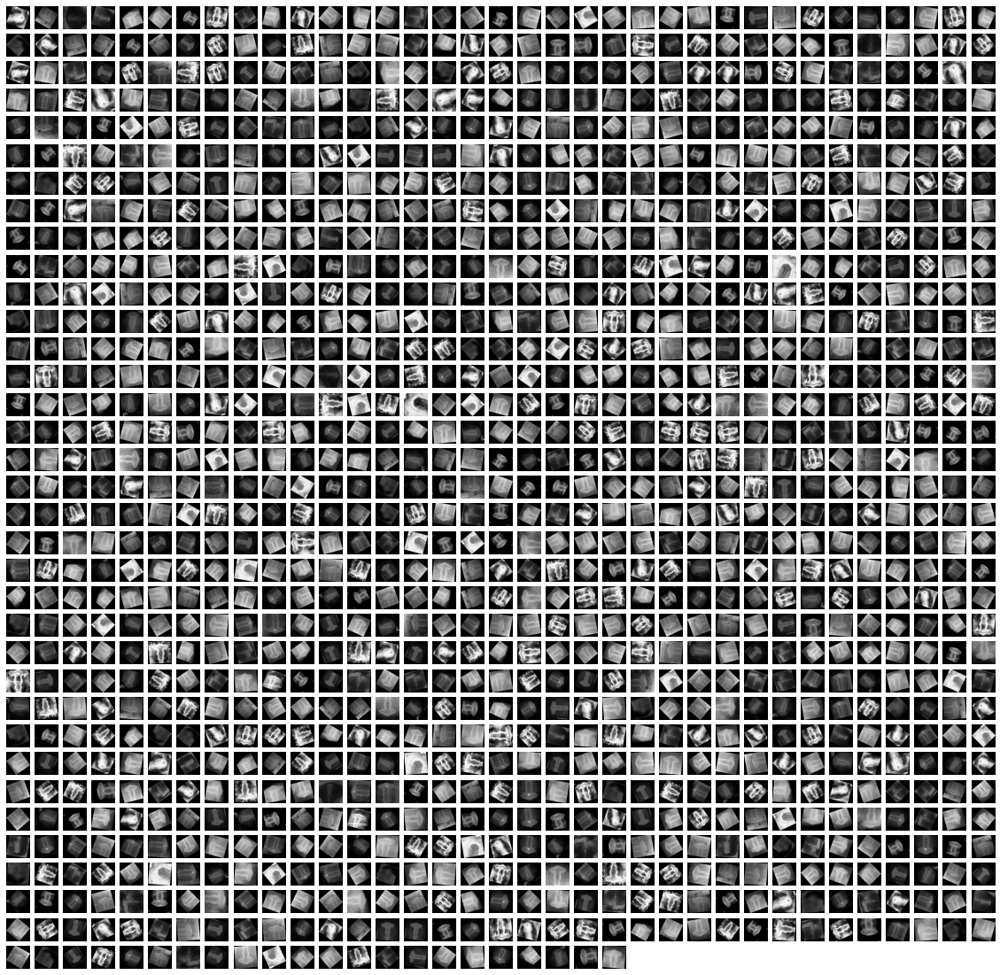

In [ ]:
fig = plt.figure(figsize=(20, 20))
results = model.predict(X_val)
nums = []
classes = []
for i in range(np.shape(X_val)[0]):
  nums.append(max(list(results[i])))
id = []
for num in nums:
  if num >0.9:
    id.append(nums.index(num))
images = []
for i in id:
  images.append(val3[i][0])
  classes.append(np.where(y_val[i]==1))
for i in range(len(images)):
  plt.subplot((int(math.ceil(np.sqrt(len(id))))), 
              (int(math.ceil(np.sqrt(len(id))))), 
              i+1)
  plt.imshow(images[i], cmap = 'gray')
  plt.axis('off')
classes = np.concatenate(classes)
print('Number of 10.1s:', sum(classes == 0))
print('Number of 10.2s:', sum(classes == 1))
print('Number of 10.3s:', sum(classes == 2))
print('Percetage of 10.1s less than 0.5', sum(classes == 0)/sum(valclasses == 0))
print('Percetage of 10.2s less than 0.5', sum(classes == 1)/sum(valclasses == 1))
print('Percetage of 10.3s less than 0.5', sum(classes == 2)/sum(valclasses == 2))

## Analysis

# Testing layers

In [ ]:
train2 = []
for feature, label in training_data:
  feature = cv2.equalizeHist(feature)
  train2.append([feature, label])  
val2 = []
for feature, label in val_data:
  feature = cv2.equalizeHist(feature)
  val2.append([feature, label])  

In [ ]:
trainclasses = []
for i in range(8065):
  trainclasses.append(np.where(y_train[i]==1))
trainclasses = np.concatenate(trainclasses)
print('Number of 10.1s:', sum(trainclasses == 0))
print('Number of 10.2s:', sum(trainclasses == 1))
print('Number of 10.3s:', sum(trainclasses == 2))
valclasses = []
for i in range(2160):
  valclasses.append(np.where(y_val[i]==1))
valclasses = np.concatenate(valclasses)
print('Number of 10.1s:', sum(valclasses == 0))
print('Number of 10.2s:', sum(valclasses == 1))
print('Number of 10.3s:', sum(valclasses == 2))
random.shuffle(train2)
random.shuffle(val2)
trainclasses = []
for i in range(8065):
  trainclasses.append(np.where(y_train[i]==1))
trainclasses = np.concatenate(trainclasses)
print('Number of 10.1s:', sum(trainclasses == 0))
print('Number of 10.2s:', sum(trainclasses == 1))
print('Number of 10.3s:', sum(trainclasses == 2))
valclasses = []
for i in range(2160):
  valclasses.append(np.where(y_val[i]==1))
valclasses = np.concatenate(valclasses)
print('Number of 10.1s:', sum(valclasses == 0))
print('Number of 10.2s:', sum(valclasses == 1))
print('Number of 10.3s:', sum(valclasses == 2))
# random.shuffle(test_data)

# Preprocessing the data into X_train etc with relevant input shapes
X_train = []
y_train = []
X_val = []
y_val = []
X_test = []
y_test = []
img_size = 200

for feature, label in train2:
  X_train.append(feature)
  y_train.append(label)

for feature, label in val2:
  X_val.append(feature)
  y_val.append(label)

# for feature, label in test_data:
#   X_test.append(feature)
#   y_test.append(label)

X_train = np.array(X_train) / 255
X_val = np.array(X_val) / 255
# X_test = np.array(X_test) / 255

X_train = X_train.reshape(X_train.shape[0], 200, 200, 1)
X_val = X_val.reshape(X_val.shape[0], 200, 200, 1)
# X_test = X_test.reshape(X_test.shape[0], 200, 200, 1)

X_train.astype('float32')
X_val.astype('float32')
# X_test.astype('float32')

y_train=to_categorical(y_train)
y_val=to_categorical(y_val)
# y_test = to_categorical(y_test)

print('X_train shape:', np.shape(X_train))
print('X_val shape:', np.shape(X_val))
# print('X_test shape:', np.shape(X_test))
print('y_train shape:', np.shape(y_train))
print('y_val shape:', np.shape(y_val))
# print('y_test shape:', np.shape(y_test))


TypeError: ignored

Epoch 1/50
253/253 [==============================] - 10s 34ms/step - loss: 1.1906 - accuracy: 0.3995 - val_loss: 1.2029 - val_accuracy: 0.2917
Epoch 2/50
253/253 [==============================] - 8s 33ms/step - loss: 1.0668 - accuracy: 0.5210 - val_loss: 1.1322 - val_accuracy: 0.4097
Epoch 3/50
253/253 [==============================] - 8s 33ms/step - loss: 0.8624 - accuracy: 0.6578 - val_loss: 0.9854 - val_accuracy: 0.6204
Epoch 4/50
253/253 [==============================] - 8s 33ms/step - loss: 0.6346 - accuracy: 0.7761 - val_loss: 0.8644 - val_accuracy: 0.7310
Epoch 5/50
253/253 [==============================] - 8s 33ms/step - loss: 0.4006 - accuracy: 0.8817 - val_loss: 0.7429 - val_accuracy: 0.8019
Epoch 6/50
253/253 [==============================] - 8s 33ms/step - loss: 0.2414 - accuracy: 0.9519 - val_loss: 0.6801 - val_accuracy: 0.8144
Epoch 7/50
253/253 [==============================] - 8s 33ms/step - loss: 0.1719 - accuracy: 0.9764 - val_loss: 0.6562 - val_accuracy: 0.814

NameError: ignored

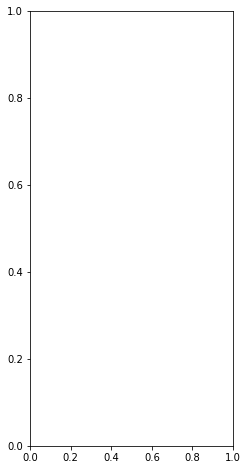

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras import regularizers
layer_drop = 0.2
final_drop = 0.5
activation = 'relu'
lamda = 0.0001
model = Sequential([
  layers.Conv2D(16, 3, padding='same', activation= activation, input_shape = (200, 200, 1), kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(32, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(64, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(128, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(256, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(512, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(1024, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Flatten(),
  layers.Dense(1024, activation=activation),
  layers.Dropout(final_drop),
  layers.Dense(3, activation = 'softmax')
])
#opt = Adam(learning_rate = learning_rate)
model.compile(optimizer = Adam(learning_rate = 0.0001),
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])

earlyStop = EarlyStopping(monitor = 'val_loss', min_delta = 0.01, patience = 5)

history = model.fit(x=X_train,
                    y=y_train,
                    epochs=50,
                    batch_size=32,
                    validation_data=(X_val, y_val))
 #                   callbacks=[earlyStop])

model.save(modelDIR + '/test_rot_model_layer_7_units_1024.h5')

    # if callback.stopped_epoch < epochs:
    #   epochs_range = range(callback.stopped_epoch + 1)
    # else:
    #   epochs_range = range(epochs)

epochs_range = range(50)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy = {}%'.format(round(np.mean(acc[max(epochs_range) - 5:max(epochs_range)])*100, 1)))
plt.plot(epochs_range, val_acc, label='Validation Accuracy = {}%'.format(round(np.mean(val_acc[max(epochs_range) - 5:max(epochs_range)])*100, 1)))
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss = {}%'.format(round(np.mean(loss[max(epochs_range) - 5:max(epochs_range)])*100, 1)))
plt.plot(epochs_range, val_loss, label='Validation Loss = {}%'.format(round(np.mean(val_loss[max(epochs_range) - 5:max(epochs_range)])*100, 1)))
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.figtext(0.425, 0.08, 'Training size = {}'.format(np.shape(X_train)[0]))
plt.figtext(0.425, 0.06, 'Validation size = {}'.format(np.shape(X_val)[0]))
plt.figtext(0.425, 0.04, 'Test accuracy = {}%'.format(round(test_acc*100, 1)))
plt.savefig(plotDIR + '/test+rot_model_layer_7_units_1024.png')
plt.show()

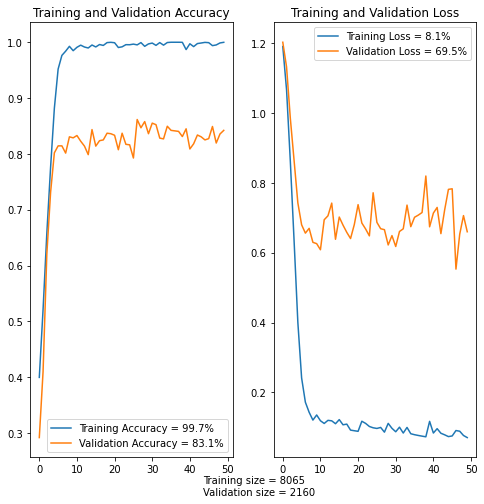

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
accuracy = history.history['val_accuracy'][-1]

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy = {}%'.format(round(np.mean(acc[max(epochs_range) - 5:max(epochs_range)])*100, 1)))
plt.plot(epochs_range, val_acc, label='Validation Accuracy = {}%'.format(round(np.mean(val_acc[max(epochs_range) - 5:max(epochs_range)])*100, 1)))
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss = {}%'.format(round(np.mean(loss[max(epochs_range) - 5:max(epochs_range)])*100, 1)))
plt.plot(epochs_range, val_loss, label='Validation Loss = {}%'.format(round(np.mean(val_loss[max(epochs_range) - 5:max(epochs_range)])*100, 1)))
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.figtext(0.425, 0.08, 'Training size = {}'.format(np.shape(X_train)[0]))
plt.figtext(0.425, 0.06, 'Validation size = {}'.format(np.shape(X_val)[0]))
plt.savefig(plotDIR + '/test+rot_model_layer_7_units_1024.png')
plt.show()

# Small layers high units

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras import regularizers
layer_drop = 0.2
final_drop = 0.5
activation = 'relu'
lamda = 0.0001
model = Sequential([
  layers.Conv2D(256, 3, padding='same', activation= activation, input_shape = (200, 200, 1), kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(512, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(512, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Flatten(),
  layers.Dense(512, activation=activation),
  layers.Dropout(final_drop),
  layers.Dense(3, activation = 'softmax')
])
#opt = Adam(learning_rate = learning_rate)
model.compile(optimizer = Adam(learning_rate = 0.0001),
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])

earlyStop = EarlyStopping(monitor = 'val_loss', min_delta = 0.01, patience = 5)

history = model.fit(x=X_train,
                    y=y_train,
                    epochs=50,
                    batch_size=32,
                    validation_data=(X_val, y_val),
                    callbacks=[earlyStop])

model.save(modelDIR + 'test_rot__layer_3_units_512_norm_hist__rotate')

Epoch 1/50
253/253 [==============================] - 101s 318ms/step - loss: 1.1231 - accuracy: 0.4409 - val_loss: 1.1052 - val_accuracy: 0.4676
Epoch 2/50
253/253 [==============================] - 77s 305ms/step - loss: 0.9540 - accuracy: 0.5785 - val_loss: 0.9058 - val_accuracy: 0.5833
Epoch 3/50
253/253 [==============================] - 77s 305ms/step - loss: 0.7006 - accuracy: 0.7304 - val_loss: 0.8048 - val_accuracy: 0.6620
Epoch 4/50
253/253 [==============================] - 77s 305ms/step - loss: 0.4167 - accuracy: 0.8570 - val_loss: 0.7407 - val_accuracy: 0.7032
Epoch 5/50
253/253 [==============================] - 77s 305ms/step - loss: 0.2358 - accuracy: 0.9334 - val_loss: 0.7981 - val_accuracy: 0.7579
Epoch 6/50
253/253 [==============================] - 77s 305ms/step - loss: 0.1479 - accuracy: 0.9645 - val_loss: 0.8059 - val_accuracy: 0.7741
Epoch 7/50
253/253 [==============================] - 77s 305ms/step - loss: 0.1050 - accuracy: 0.9820 - val_loss: 0.7674 - val_a

In [ ]:
K.clear_session()

# Trying both hist and non hists

In [ ]:
train2 = []
for feature, label in training_data:
  feature = cv2.equalizeHist(feature)
  train2.append([feature, label])  
val2 = []
for feature, label in val_data:
  feature = cv2.equalizeHist(feature)
  val2.append([feature, label])  

In [ ]:
long_train = np.vstack((training_data, train2))
long_val = np.vstack((val_data, val2))
np.shape(long_train)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


(16130, 2)

In [ ]:
np.shape(np.vstack((training_data, train2)))

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


(16130, 2)

In [ ]:
classnum = []
for feature, label in long_train:
  classnum.append(label)

sum0 = 0
for num in range(len(long_train)):
  if classnum[num] == 0:
    sum0 += 1

sum1 = 0
for num in range(len(long_train)):
  if classnum[num] == 1:
    sum1 += 1

sum2 = 0
for num in range(len(long_train)):
  if classnum[num] == 2:
    sum2 += 1

print('Number of 10.1s in training set:', sum0)
print('Number of 10.2s in training set:', sum1)
print('Number of 10.3s in training set:', sum2)

classnum = []
for feature, label in long_val:
  classnum.append(label)

sum0 = 0
for num in range(len(long_val)):
  if classnum[num] == 0:
    sum0 += 1

sum1 = 0
for num in range(len(long_val)):
  if classnum[num] == 1:
    sum1 += 1

sum2 = 0
for num in range(len(long_val)):
  if classnum[num] == 2:
    sum2 += 1

print('Number of 10.1s in validation set:', sum0)
print('Number of 10.2s in validation set:', sum1)
print('Number of 10.3s in validation set:', sum2)

random.shuffle(long_train)
random.shuffle(long_val)

# Preprocessing the data into X_train etc with relevant input shapes
X_train = []
y_train = []
X_val = []
y_val = []
X_test = []
y_test = []
img_size = 200

for feature, label in long_train:
  X_train.append(feature)
  y_train.append(label)

for feature, label in long_val:
  X_val.append(feature)
  y_val.append(label)

# for feature, label in test_data:
#   X_test.append(feature)
#   y_test.append(label)

X_train = np.array(X_train) / 255
X_val = np.array(X_val) / 255
# X_test = np.array(X_test) / 255

X_train = X_train.reshape(X_train.shape[0], 200, 200, 1)
X_val = X_val.reshape(X_val.shape[0], 200, 200, 1)
# X_test = X_test.reshape(X_test.shape[0], 200, 200, 1)

X_train.astype('float32')
X_val.astype('float32')
# X_test.astype('float32')

y_train=to_categorical(y_train)
y_val=to_categorical(y_val)
# y_test = to_categorical(y_test)

print('X_train shape:', np.shape(X_train))
print('X_val shape:', np.shape(X_val))
# print('X_test shape:', np.shape(X_test))
print('y_train shape:', np.shape(y_train))
print('y_val shape:', np.shape(y_val))
# print('y_test shape:', np.shape(y_test))

trainclasses = []
for i in range(np.shape(y_train)[0]):
  trainclasses.append(np.where(y_train[i]==1))
trainclasses = np.concatenate(trainclasses)
sum0 = 0
sum1 = 0
sum2 = 0
for i in range(len(trainclasses)):
  if trainclasses[i] == 0:
    sum0 += 1
  if trainclasses[i] == 1:
    sum1 += 1
  if trainclasses[i] == 2:
    sum2 += 1
print(sum0)
print(sum1)
print(sum2)
valclasses = []
for i in range(np.shape(y_val)[0]):
  valclasses.append(np.where(y_val[i]==1))
valclasses = np.concatenate(valclasses)
sum0 = 0
sum1 = 0
sum2 = 0
for i in range(len(valclasses)):
  if valclasses[i] == 'array([0])':
    sum0 += 1
  if valclasses[i] == 'array([1])':
    sum1 += 1
  if valclasses[i] == 'array([2])':
    sum2 += 1
print(sum0)
print(sum1)
print(sum2)

Number of 10.1s in training set: 9289
Number of 10.2s in training set: 4716
Number of 10.3s in training set: 2125
Number of 10.1s in validation set: 2560
Number of 10.2s in validation set: 1240
Number of 10.3s in validation set: 520
X_train shape: (16130, 200, 200, 1)
X_val shape: (4320, 200, 200, 1)
y_train shape: (16130, 3)
y_val shape: (4320, 3)
12435
2808
887
0
0
0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:119: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:121: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:123: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


In [ ]:
len(list(np.where(y_train == 1)[1] == 0))

16130

In [ ]:
sum0 = 0
for i in range(np.shape(y_train)[0]):
  if list(np.where(y_train == 1)[1])[i]==1:
    sum0 += 1

In [ ]:
sum0

12435

In [ ]:
sum0 += 1

In [ ]:
sum0

2811

In [ ]:
list(np.where(y_train == 1)[1])[5] == 2

False

# Bad split

## Importing bad split data

In [ ]:
import zipfile
!unzip '/content/opt_12_08_2021__09_05_38.zip'

Streaming output truncated to the last 5000 lines.
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate32010.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate28010.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate30010.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate29510.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate30510.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate28510.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate33010.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate31510.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate27510.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate26510.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate24010.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate24510.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate26010.3_027.jpg  


In [ ]:
training_data2 = create_training_data('opt_12_08_2021__09_05_38/train', train = True)
val_data2 = create_training_data('opt_12_08_2021__09_05_38/val', val = True)
test_data2 = create_training_data(path + '/test', test = True)

100%|██████████| 3/3 [00:00<00:00, 162.51it/s]


## Running the model

In [ ]:
random.shuffle(training_data2)
random.shuffle(val_data2)
random.shuffle(test_data2)

# Preprocessing the data into X_train etc with relevant input shapes
X_train = []
y_train = []
X_val = []
y_val = []
X_test = []
y_test = []
img_size = 200

for feature, label in training_data2:
  X_train.append(feature)
  y_train.append(label)

for feature, label in val_data2:
  X_val.append(feature)
  y_val.append(label)

for feature, label in test_data2:
  X_test.append(feature)
  y_test.append(label)

X_train = np.array(X_train) / 255
X_val = np.array(X_val) / 255
X_test = np.array(X_test) / 255

X_train = X_train.reshape(X_train.shape[0], 200, 200, 1)
X_val = X_val.reshape(X_val.shape[0], 200, 200, 1)
X_test = X_test.reshape(X_test.shape[0], 200, 200, 1)

X_train.astype('float32')
X_val.astype('float32')
X_test.astype('float32')

y_train=to_categorical(y_train)
y_val=to_categorical(y_val)
y_test = to_categorical(y_test)

print('X_train shape:', np.shape(X_train))
print('X_val shape:', np.shape(X_val))
print('X_test shape:', np.shape(X_test))
print('y_train shape:', np.shape(y_train))
print('y_val shape:', np.shape(y_val))
print('y_test shape:', np.shape(y_test))


model = create_model(optimizer = 'adam',
                      learning_rate = 0.0001,
                      layer_drop = 0.2,
                      final_drop = 0.5,
                      activation = 'relu',
                      lamda = 0.001)

earlyStop = EarlyStopping(monitor = 'val_loss', min_delta = 0.01, patience = 5)

# callbacks_list = [callback_log, earlyStop]

history2 = model.fit(x=X_train,
                    y=y_train,
                    epochs=50,
                    batch_size=32,
                    validation_data=(X_val, y_val),
                    callbacks=[earlyStop])


X_train shape: (8568, 200, 200, 1)
X_val shape: (1656, 200, 200, 1)
X_test shape: (9, 200, 200, 1)
y_train shape: (8568, 3)
y_val shape: (1656, 3)
y_test shape: (9, 3)
Epoch 1/50
268/268 [==============================] - 7s 24ms/step - loss: 1.5371 - accuracy: 0.3957 - val_loss: 1.4028 - val_accuracy: 0.4457
Epoch 2/50
268/268 [==============================] - 6s 23ms/step - loss: 1.2390 - accuracy: 0.5343 - val_loss: 1.2595 - val_accuracy: 0.5447
Epoch 3/50
268/268 [==============================] - 6s 23ms/step - loss: 1.0239 - accuracy: 0.6511 - val_loss: 1.2141 - val_accuracy: 0.5586
Epoch 4/50
268/268 [==============================] - 6s 23ms/step - loss: 0.8354 - accuracy: 0.7518 - val_loss: 1.3012 - val_accuracy: 0.5145
Epoch 5/50
268/268 [==============================] - 6s 23ms/step - loss: 0.6520 - accuracy: 0.8399 - val_loss: 1.3691 - val_accuracy: 0.4529
Epoch 6/50
268/268 [==============================] - 6s 23ms/step - loss: 0.5451 - accuracy: 0.8818 - val_loss: 1.32

## Analysing lowest probability predictions


In [ ]:
trainclasses = []
for i in range(8568):
  trainclasses.append(np.where(y_train[i]==1))
trainclasses = np.concatenate(trainclasses)
print('Number of 10.1s:', sum(trainclasses == 0))
print('Number of 10.2s:', sum(trainclasses == 1))
print('Number of 10.3s:', sum(trainclasses == 2))

Number of 10.1s: [3096]
Number of 10.2s: [3096]
Number of 10.3s: [2376]


In [ ]:
valclasses = []
for i in range(1656):
  valclasses.append(np.where(y_val[i]==1))
valclasses = np.concatenate(valclasses)
print('Number of 10.1s:', sum(valclasses == 0))
print('Number of 10.2s:', sum(valclasses == 1))
print('Number of 10.3s:', sum(valclasses == 2))

Number of 10.1s: [576]
Number of 10.2s: [648]
Number of 10.3s: [432]


Number of 10.1s: [25]
Number of 10.2s: [18]
Number of 10.3s: [44]
Percetage of 10.1s less than 0.5 [0.04340278]
Percetage of 10.2s less than 0.5 [0.02777778]
Percetage of 10.3s less than 0.5 [0.10185185]


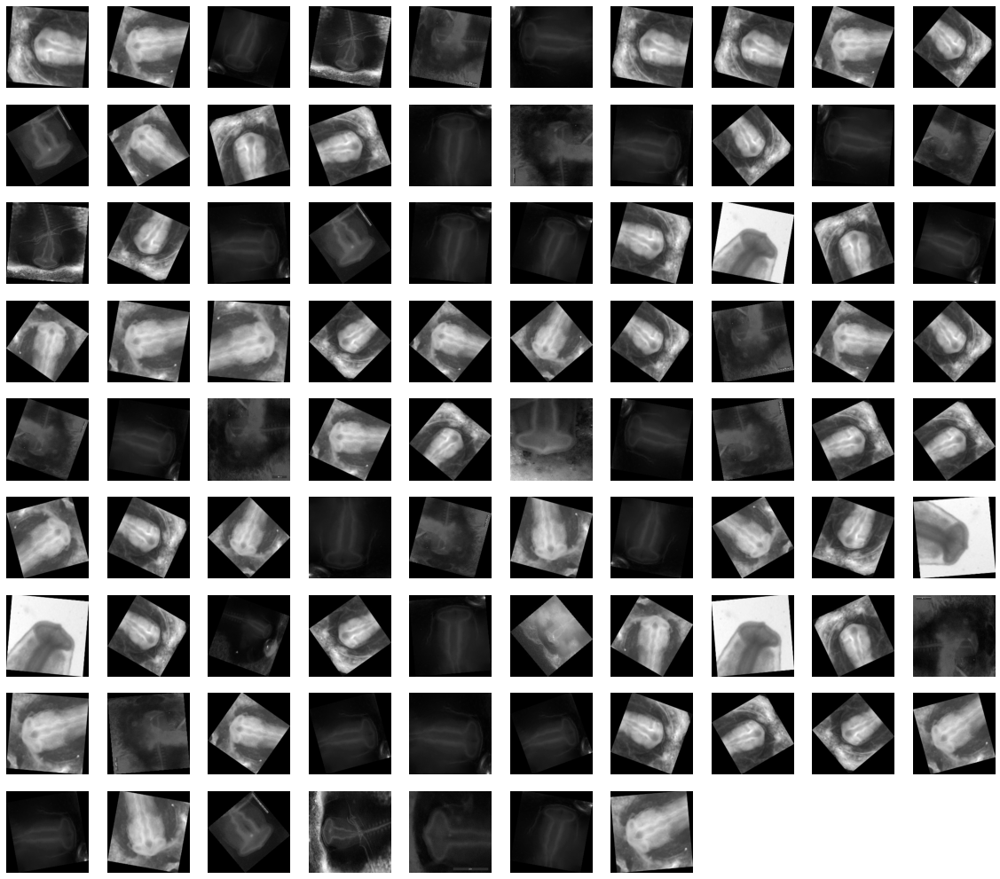

In [ ]:
fig = plt.figure(figsize=(20, 20))
results = model.predict(X_val)
nums = []
classes = []
for i in range(np.shape(X_val)[0]):
  nums.append(max(list(results[i])))
id = []
for num in nums:
  if num < 0.5:
    id.append(nums.index(num))
images = []
for i in id:
  images.append(val_data2[i][0])
  classes.append(np.where(y_val[i]==1))
for i in range(len(images)):
  plt.subplot((int(math.ceil(np.sqrt(len(id))))), 
              (int(math.ceil(np.sqrt(len(id))))), 
              i+1)
  plt.imshow(images[i], cmap = 'gray')
  plt.axis('off')
classes = np.concatenate(classes)
print('Number of 10.1s:', sum(classes == 0))
print('Number of 10.2s:', sum(classes == 1))
print('Number of 10.3s:', sum(classes == 2))
print('Percetage of 10.1s less than 0.5', sum(classes == 0)/sum(valclasses == 0))
print('Percetage of 10.2s less than 0.5', sum(classes == 1)/sum(valclasses == 1))
print('Percetage of 10.3s less than 0.5', sum(classes == 2)/sum(valclasses == 2))

Number of 10.1s: [118]
Number of 10.2s: [187]
Number of 10.3s: [36]
Percetage of 10.1s more than 0.9 [0.20486111]
Percetage of 10.2s more than 0.9 [0.28858025]
Percetage of 10.3s more than 0.9 [0.08333333]


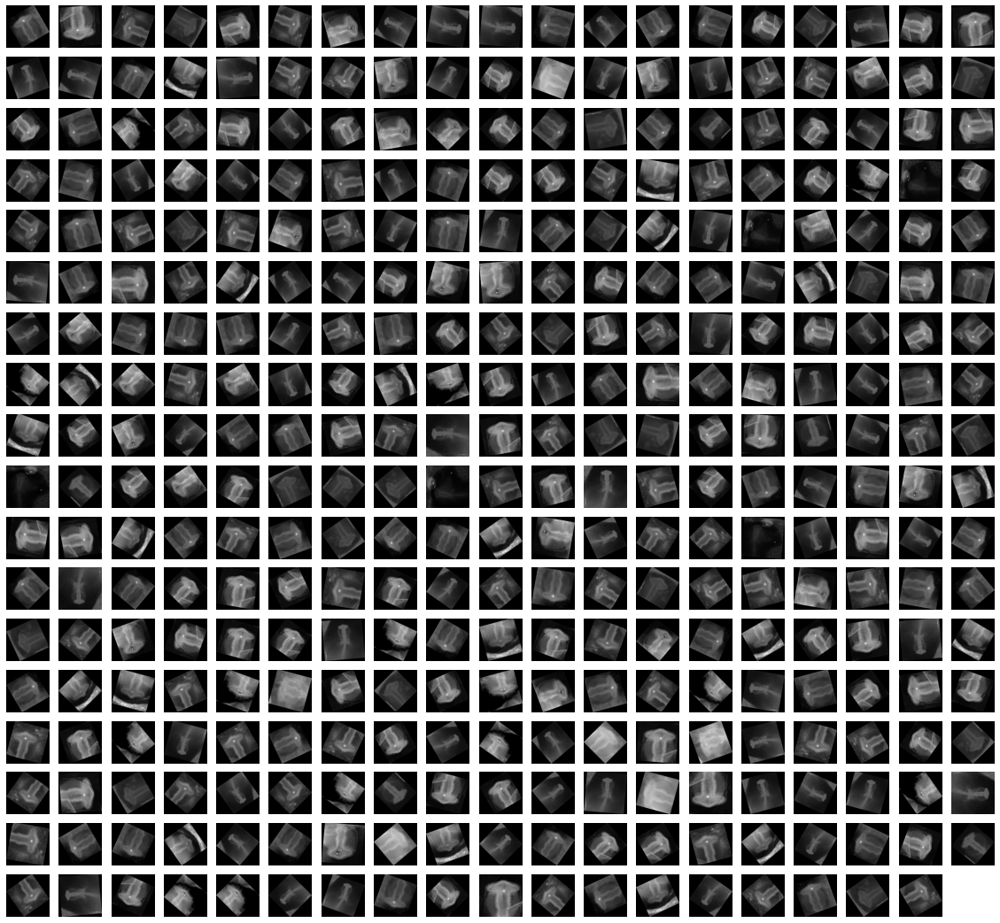

In [ ]:
fig = plt.figure(figsize=(20, 20))
results = model.predict(X_val)
nums = []
classes = []
for i in range(np.shape(X_val)[0]):
  nums.append(max(list(results[i])))
id = []
for num in nums:
  if num > 0.9:
    id.append(nums.index(num))
images = []
for i in id:
  images.append(val_data2[i][0])
  classes.append(np.where(y_val[i]==1))
for i in range(len(images)):
  plt.subplot((int(math.ceil(np.sqrt(len(id))))), 
              (int(math.ceil(np.sqrt(len(id))))), 
              i+1)
  plt.imshow(images[i], cmap = 'gray')
  plt.axis('off')
classes = np.concatenate(classes)
print('Number of 10.1s:', sum(classes == 0))
print('Number of 10.2s:', sum(classes == 1))
print('Number of 10.3s:', sum(classes == 2))
print('Percetage of 10.1s more than 0.9', sum(classes == 0)/sum(valclasses == 0))
print('Percetage of 10.2s more than 0.9', sum(classes == 1)/sum(valclasses == 1))
print('Percetage of 10.3s more than 0.9', sum(classes == 2)/sum(valclasses == 2))

In [ ]:
trainbad2 = []
for feature, label in training_data2:
  feature = cv2.equalizeHist(feature)
  trainbad2.append([feature, label])  

valbad2 = []
for feature, label in val_data2:
  feature = cv2.equalizeHist(feature)
  valbad2.append([feature, label]) 

In [ ]:
print((training_data2[0][0] == train2[0][0]))
for i in range(8065):
  if training_data[i][0] == train2[i][0] == 

[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


In [ ]:
random.shuffle(trainbad2)
random.shuffle(valbad2)
random.shuffle(test_data2)

# Preprocessing the data into X_train etc with relevant input shapes
X_train = []
y_train = []
X_val = []
y_val = []
X_test = []
y_test = []
img_size = 200

for feature, label in trainbad2:
  X_train.append(feature)
  y_train.append(label)

for feature, label in valbad2:
  X_val.append(feature)
  y_val.append(label)

for feature, label in test_data2:
  X_test.append(feature)
  y_test.append(label)

X_train = np.array(X_train) / 255
X_val = np.array(X_val) / 255
X_test = np.array(X_test) / 255

X_train = X_train.reshape(X_train.shape[0], 200, 200, 1)
X_val = X_val.reshape(X_val.shape[0], 200, 200, 1)
X_test = X_test.reshape(X_test.shape[0], 200, 200, 1)

X_train.astype('float32')
X_val.astype('float32')
X_test.astype('float32')

y_train=to_categorical(y_train)
y_val=to_categorical(y_val)
y_test = to_categorical(y_test)

print('X_train shape should be:', 0.7*(len(training_data) + len(test_data) + len(val_data)))
print('X_train shape:', np.shape(X_train))
print('X_val and X_test shapes should be:', 0.15*(len(training_data) + len(test_data) + len(val_data)))
print('X_val shape:', np.shape(X_val))
print('X_test shape:', np.shape(X_test))
print('y_train shape:', np.shape(y_train))
print('y_val shape:', np.shape(y_val))
print('y_test shape:', np.shape(y_test))


model = create_model(optimizer = 'adam',
                      learning_rate = 0.0001,
                      layer_drop = 0.2,
                      final_drop = 0.5,
                      activation = 'relu',
                      lamda = 0.001)

earlyStop = EarlyStopping(monitor = 'val_loss', min_delta = 0.01, patience = 5)

# callbacks_list = [callback_log, earlyStop]

history3 = model.fit(x=X_train,
                    y=y_train,
                    epochs=50,
                    batch_size=32,
                    validation_data=(X_val, y_val),
                    callbacks=[earlyStop])


X_train shape should be: 7163.799999999999
X_train shape: (8568, 200, 200, 1)
X_val and X_test shapes should be: 1535.1
X_val shape: (1656, 200, 200, 1)
X_test shape: (9, 200, 200, 1)
y_train shape: (8568, 3)
y_val shape: (1656, 3)
y_test shape: (9, 3)
Epoch 1/50
268/268 [==============================] - 7s 24ms/step - loss: 1.5425 - accuracy: 0.3983 - val_loss: 1.4499 - val_accuracy: 0.3533
Epoch 2/50
268/268 [==============================] - 6s 23ms/step - loss: 1.2153 - accuracy: 0.5794 - val_loss: 1.3921 - val_accuracy: 0.4185
Epoch 3/50
268/268 [==============================] - 6s 23ms/step - loss: 0.9695 - accuracy: 0.7198 - val_loss: 1.3268 - val_accuracy: 0.4620
Epoch 4/50
268/268 [==============================] - 6s 23ms/step - loss: 0.7839 - accuracy: 0.8056 - val_loss: 1.2479 - val_accuracy: 0.4656
Epoch 5/50
268/268 [==============================] - 6s 23ms/step - loss: 0.6427 - accuracy: 0.8620 - val_loss: 1.2272 - val_accuracy: 0.4801
Epoch 6/50
268/268 [============

In [ ]:
trainclasses = []
for i in range(8568):
  trainclasses.append(np.where(y_train[i]==1))
trainclasses = np.concatenate(trainclasses)
print('Number of 10.1s:', sum(trainclasses == 0))
print('Number of 10.2s:', sum(trainclasses == 1))
print('Number of 10.3s:', sum(trainclasses == 2))

Number of 10.1s: [2900]
Number of 10.2s: [2909]
Number of 10.3s: [2256]


In [ ]:
valclasses = []
for i in range(1656):
  valclasses.append(np.where(y_val[i]==1))
valclasses = np.concatenate(valclasses)
print('Number of 10.1s:', sum(valclasses == 0))
print('Number of 10.2s:', sum(valclasses == 1))
print('Number of 10.3s:', sum(valclasses == 2))

Number of 10.1s: [576]
Number of 10.2s: [648]
Number of 10.3s: [432]


Number of 10.1s: [19]
Number of 10.2s: [33]
Number of 10.3s: [50]
Percetage of 10.1s more than 0.9 [0.03298611]
Percetage of 10.2s more than 0.9 [0.05092593]
Percetage of 10.3s more than 0.9 [0.11574074]


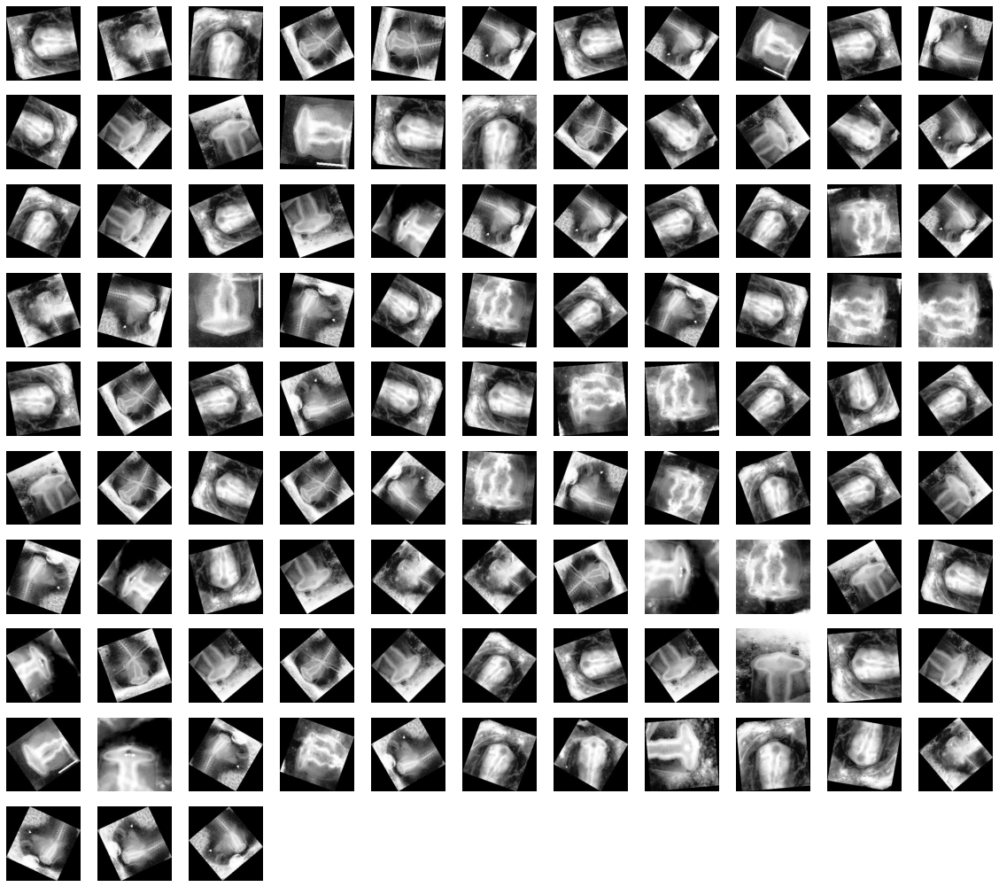

In [ ]:
fig = plt.figure(figsize=(20, 20))
results = model.predict(X_val)
nums = []
classes = []
for i in range(np.shape(X_val)[0]):
  nums.append(max(list(results[i])))
id = []
for num in nums:
  if num < 0.5:
    id.append(nums.index(num))
images = []
for i in id:
  images.append(valbad2[i][0])
  classes.append(np.where(y_val[i]==1))
for i in range(len(images)):
  plt.subplot((int(math.ceil(np.sqrt(len(id))))), 
              (int(math.ceil(np.sqrt(len(id))))), 
              i+1)
  plt.imshow(images[i], cmap = 'gray')
  plt.axis('off')
classes = np.concatenate(classes)
print('Number of 10.1s:', sum(classes == 0))
print('Number of 10.2s:', sum(classes == 1))
print('Number of 10.3s:', sum(classes == 2))
print('Percetage of 10.1s less than 0.5', sum(classes == 0)/sum(valclasses == 0))
print('Percetage of 10.2s less than 0.5', sum(classes == 1)/sum(valclasses == 1))
print('Percetage of 10.3s less than 0.5', sum(classes == 2)/sum(valclasses == 2))

Number of 10.1s: [264]
Number of 10.2s: [121]
Number of 10.3s: [139]
Percetage of 10.1s more than 0.9 [0.45833333]
Percetage of 10.2s more than 0.9 [0.1867284]
Percetage of 10.3s more than 0.9 [0.32175926]


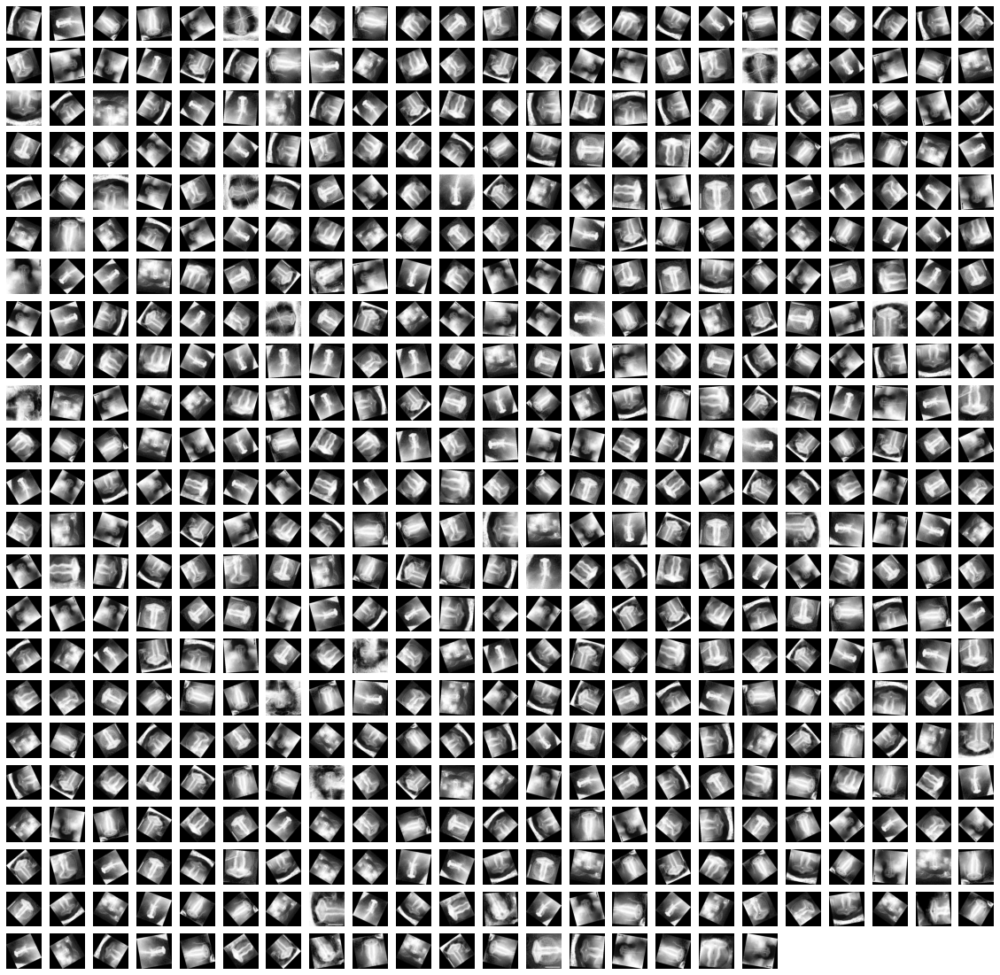

In [ ]:
fig = plt.figure(figsize=(20, 20))
results = model.predict(X_val)
nums = []
classes = []
for i in range(np.shape(X_val)[0]):
  nums.append(max(list(results[i])))
id = []
for num in nums:
  if num > 0.9:
    id.append(nums.index(num))
images = []
for i in id:
  images.append(valbad2[i][0])
  classes.append(np.where(y_val[i]==1))
for i in range(len(images)):
  plt.subplot((int(math.ceil(np.sqrt(len(id))))), 
              (int(math.ceil(np.sqrt(len(id))))), 
              i+1)
  plt.imshow(images[i], cmap = 'gray')
  plt.axis('off')
classes = np.concatenate(classes)
print('Number of 10.1s:', sum(classes == 0))
print('Number of 10.2s:', sum(classes == 1))
print('Number of 10.3s:', sum(classes == 2))
print('Percetage of 10.1s more than 0.9', sum(classes == 0)/sum(valclasses == 0))
print('Percetage of 10.2s more than 0.9', sum(classes == 1)/sum(valclasses == 1))
print('Percetage of 10.3s more than 0.9', sum(classes == 2)/sum(valclasses == 2))

## Analysis

# Second bad split

In [ ]:
import zipfile
!unzip '/content/opt_12_08_2021__08_51_06-new.zip'

Streaming output truncated to the last 5000 lines.
  inflating: opt_12_08_2021__08_51_06/train/10_1/rotate510.1_003.jpg  
  inflating: opt_12_08_2021__08_51_06/train/10_1/rotate32510.1_051.jpg  
  inflating: opt_12_08_2021__08_51_06/train/10_1/rotate010.1_003.jpg  
  inflating: opt_12_08_2021__08_51_06/train/10_3/rotate22510.3_015.jpg  
  inflating: opt_12_08_2021__08_51_06/train/10_1/rotate2010.1_003.jpg  
  inflating: opt_12_08_2021__08_51_06/train/10_1/rotate1010.1_003.jpg  
  inflating: opt_12_08_2021__08_51_06/train/10_1/rotate34510.1_051.jpg  
  inflating: opt_12_08_2021__08_51_06/train/10_1/rotate33510.1_051.jpg  
  inflating: opt_12_08_2021__08_51_06/train/10_1/rotate34010.1_051.jpg  
  inflating: opt_12_08_2021__08_51_06/train/10_1/rotate2510.1_003.jpg  
  inflating: opt_12_08_2021__08_51_06/train/10_1/rotate1510.1_003.jpg  
  inflating: opt_12_08_2021__08_51_06/train/10_1/rotate32010.1_051.jpg  
  inflating: opt_12_08_2021__08_51_06/train/10_1/rotate33010.1_051.jpg  
  inflat

In [ ]:
training_data3 = create_training_data('opt_12_08_2021__08_51_06/train', train = True)
val_data3 = create_training_data('opt_12_08_2021__08_51_06/val', val = True)
# test_data3 = create_training_data(path + '/test', test = True)

100%|██████████| 432/432 [00:01<00:00, 280.98it/s]


In [ ]:
random.shuffle(training_data3)
random.shuffle(val_data3)
random.shuffle(test_data3)

# Preprocessing the data into X_train etc with relevant input shapes
X_train = []
y_train = []
X_val = []
y_val = []
X_test = []
y_test = []
img_size = 200

for feature, label in training_data3:
  X_train.append(feature)
  y_train.append(label)

for feature, label in val_data3:
  X_val.append(feature)
  y_val.append(label)

for feature, label in test_data2:
  X_test.append(feature)
  y_test.append(label)

X_train = np.array(X_train) / 255
X_val = np.array(X_val) / 255
X_test = np.array(X_test) / 255

X_train = X_train.reshape(X_train.shape[0], 200, 200, 1)
X_val = X_val.reshape(X_val.shape[0], 200, 200, 1)
X_test = X_test.reshape(X_test.shape[0], 200, 200, 1)

X_train.astype('float32')
X_val.astype('float32')
X_test.astype('float32')

y_train=to_categorical(y_train)
y_val=to_categorical(y_val)
y_test = to_categorical(y_test)

print('X_train shape:', np.shape(X_train))
print('X_val shape:', np.shape(X_val))
print('X_test shape:', np.shape(X_test))
print('y_train shape:', np.shape(y_train))
print('y_val shape:', np.shape(y_val))
print('y_test shape:', np.shape(y_test))


model = create_model(optimizer = 'adam',
                      learning_rate = 0.0001,
                      layer_drop = 0.2,
                      final_drop = 0.5,
                      activation = 'relu',
                      lamda = 0.001)

earlyStop = EarlyStopping(monitor = 'val_loss', min_delta = 0.01, patience = 5)

# callbacks_list = [callback_log, earlyStop]

history2 = model.fit(x=X_train,
                    y=y_train,
                    epochs=50,
                    batch_size=32,
                    validation_data=(X_val, y_val),
                    callbacks=[earlyStop])


X_train shape: (8568, 200, 200, 1)
X_val shape: (1656, 200, 200, 1)
X_test shape: (9, 200, 200, 1)
y_train shape: (8568, 3)
y_val shape: (1656, 3)
y_test shape: (9, 3)
Epoch 1/50
268/268 [==============================] - 7s 25ms/step - loss: 1.4603 - accuracy: 0.4203 - val_loss: 1.3059 - val_accuracy: 0.3068
Epoch 2/50
268/268 [==============================] - 6s 23ms/step - loss: 1.1963 - accuracy: 0.4886 - val_loss: 1.2232 - val_accuracy: 0.4155
Epoch 3/50
268/268 [==============================] - 6s 23ms/step - loss: 1.0662 - accuracy: 0.5605 - val_loss: 1.2110 - val_accuracy: 0.3194
Epoch 4/50
268/268 [==============================] - 6s 23ms/step - loss: 0.9832 - accuracy: 0.6034 - val_loss: 1.2305 - val_accuracy: 0.3901
Epoch 5/50
268/268 [==============================] - 6s 23ms/step - loss: 0.9271 - accuracy: 0.6264 - val_loss: 1.1596 - val_accuracy: 0.4354
Epoch 6/50
268/268 [==============================] - 6s 23ms/step - loss: 0.8473 - accuracy: 0.6734 - val_loss: 1.14

In [ ]:
trainclasses = []
for i in range(8568):
  trainclasses.append(np.where(y_train[i]==1))
trainclasses = np.concatenate(trainclasses)
print('Number of 10.1s:', sum(trainclasses == 0))
print('Number of 10.2s:', sum(trainclasses == 1))
print('Number of 10.3s:', sum(trainclasses == 2))

Number of 10.1s: [3096]
Number of 10.2s: [3096]
Number of 10.3s: [2376]


In [ ]:
valclasses = []
for i in range(1656):
  valclasses.append(np.where(y_val[i]==1))
valclasses = np.concatenate(valclasses)
print('Number of 10.1s:', sum(valclasses == 0))
print('Number of 10.2s:', sum(valclasses == 1))
print('Number of 10.3s:', sum(valclasses == 2))

Number of 10.1s: [576]
Number of 10.2s: [648]
Number of 10.3s: [432]


Number of 10.1s: [27]
Number of 10.2s: [30]
Number of 10.3s: [66]
Percetage of 10.1s less than 0.5 [0.046875]
Percetage of 10.2s less than 0.5 [0.0462963]
Percetage of 10.3s less than 0.5 [0.15277778]


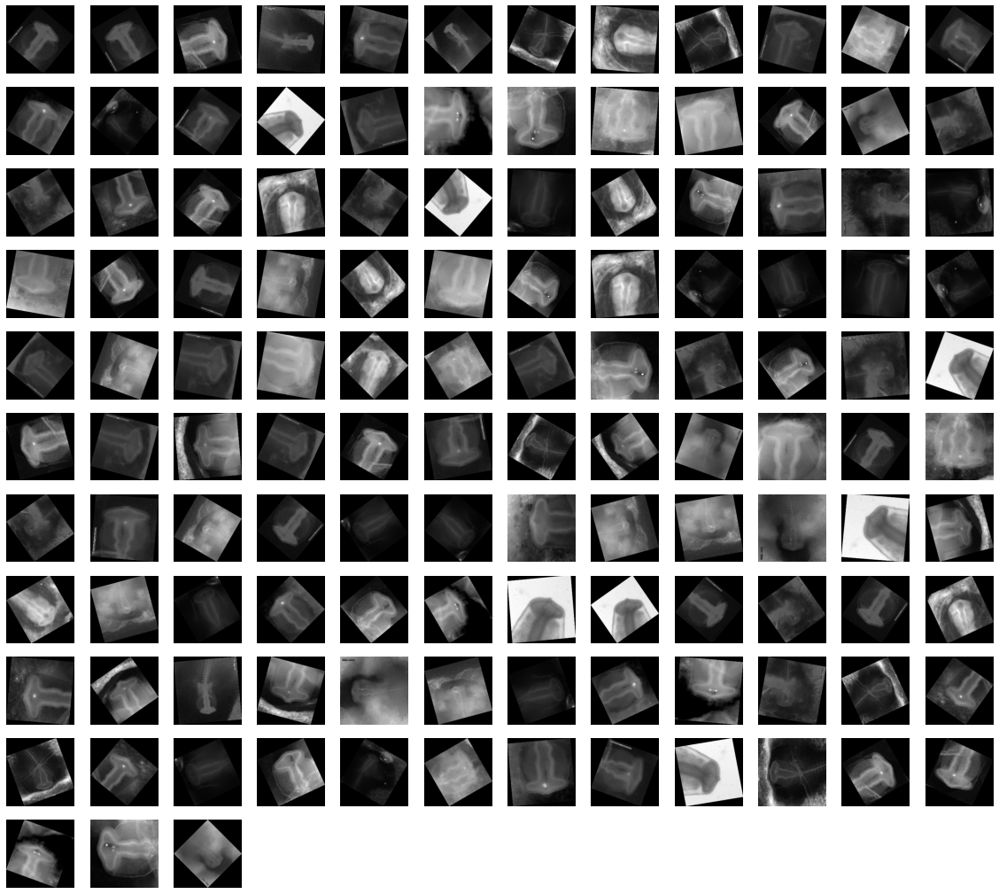

In [ ]:
fig = plt.figure(figsize=(20, 20))
results = model.predict(X_val)
nums = []
classes = []
for i in range(np.shape(X_val)[0]):
  nums.append(max(list(results[i])))
id = []
for num in nums:
  if num < 0.5:
    id.append(nums.index(num))
images = []
for i in id:
  images.append(val_data2[i][0])
  classes.append(np.where(y_val[i]==1))
for i in range(len(images)):
  plt.subplot((int(math.ceil(np.sqrt(len(id))))), 
              (int(math.ceil(np.sqrt(len(id))))), 
              i+1)
  plt.imshow(images[i], cmap = 'gray')
  plt.axis('off')
classes = np.concatenate(classes)
print('Number of 10.1s:', sum(classes == 0))
print('Number of 10.2s:', sum(classes == 1))
print('Number of 10.3s:', sum(classes == 2))
print('Percetage of 10.1s less than 0.5', sum(classes == 0)/sum(valclasses == 0))
print('Percetage of 10.2s less than 0.5', sum(classes == 1)/sum(valclasses == 1))
print('Percetage of 10.3s less than 0.5', sum(classes == 2)/sum(valclasses == 2))

Number of 10.1s: [25]
Number of 10.2s: [67]
Number of 10.3s: [76]
Percetage of 10.1s more than 0.9 [0.04340278]
Percetage of 10.2s more than 0.9 [0.10339506]
Percetage of 10.3s more than 0.9 [0.17592593]


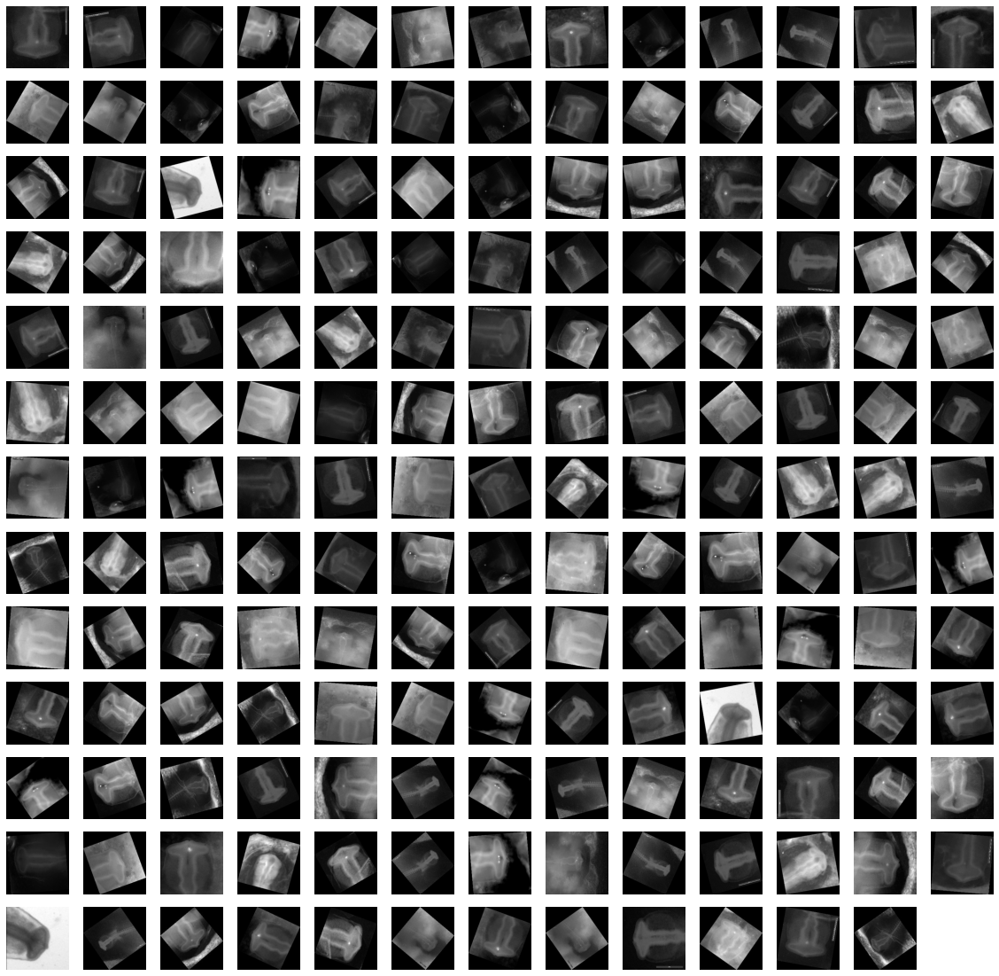

In [ ]:
fig = plt.figure(figsize=(20, 20))
results = model.predict(X_val)
nums = []
classes = []
for i in range(np.shape(X_val)[0]):
  nums.append(max(list(results[i])))
id = []
for num in nums:
  if num > 0.9:
    id.append(nums.index(num))
images = []
for i in id:
  images.append(val_data2[i][0])
  classes.append(np.where(y_val[i]==1))
for i in range(len(images)):
  plt.subplot((int(math.ceil(np.sqrt(len(id))))), 
              (int(math.ceil(np.sqrt(len(id))))), 
              i+1)
  plt.imshow(images[i], cmap = 'gray')
  plt.axis('off')
classes = np.concatenate(classes)
print('Number of 10.1s:', sum(classes == 0))
print('Number of 10.2s:', sum(classes == 1))
print('Number of 10.3s:', sum(classes == 2))
print('Percentage of 10.1s more than 0.9', sum(classes == 0)/sum(valclasses == 0))
print('Percentage of 10.2s more than 0.9', sum(classes == 1)/sum(valclasses == 1))
print('Percentage of 10.3s more than 0.9', sum(classes == 2)/sum(valclasses == 2))

In [ ]:
trainbad3 = []
for feature, label in training_data3:
  feature = cv2.equalizeHist(feature)
  trainbad3.append([feature, label])  

valbad3 = []
for feature, label in val_data3:
  feature = cv2.equalizeHist(feature)
  valbad3.append([feature, label]) 

In [ ]:
random.shuffle(trainbad3)
random.shuffle(valbad3)
random.shuffle(test_data3)

# Preprocessing the data into X_train etc with relevant input shapes
X_train = []
y_train = []
X_val = []
y_val = []
X_test = []
y_test = []
img_size = 200

for feature, label in trainbad3:
  X_train.append(feature)
  y_train.append(label)

for feature, label in valbad3:
  X_val.append(feature)
  y_val.append(label)

for feature, label in test_data3:
  X_test.append(feature)
  y_test.append(label)

X_train = np.array(X_train) / 255
X_val = np.array(X_val) / 255
X_test = np.array(X_test) / 255

X_train = X_train.reshape(X_train.shape[0], 200, 200, 1)
X_val = X_val.reshape(X_val.shape[0], 200, 200, 1)
X_test = X_test.reshape(X_test.shape[0], 200, 200, 1)

X_train.astype('float32')
X_val.astype('float32')
X_test.astype('float32')

y_train=to_categorical(y_train)
y_val=to_categorical(y_val)
y_test = to_categorical(y_test)

print('X_train shape should be:', 0.7*(len(training_data) + len(test_data) + len(val_data)))
print('X_train shape:', np.shape(X_train))
print('X_val and X_test shapes should be:', 0.15*(len(training_data) + len(test_data) + len(val_data)))
print('X_val shape:', np.shape(X_val))
print('X_test shape:', np.shape(X_test))
print('y_train shape:', np.shape(y_train))
print('y_val shape:', np.shape(y_val))
print('y_test shape:', np.shape(y_test))


model = create_model(optimizer = 'adam',
                      learning_rate = 0.0001,
                      layer_drop = 0.2,
                      final_drop = 0.5,
                      activation = 'relu',
                      lamda = 0.001)

earlyStop = EarlyStopping(monitor = 'val_loss', min_delta = 0.01, patience = 5)

# callbacks_list = [callback_log, earlyStop]

history3 = model.fit(x=X_train,
                    y=y_train,
                    epochs=50,
                    batch_size=32,
                    validation_data=(X_val, y_val),
                    callbacks=[earlyStop])


X_train shape should be: 7163.799999999999
X_train shape: (8568, 200, 200, 1)
X_val and X_test shapes should be: 1535.1
X_val shape: (1656, 200, 200, 1)
X_test shape: (9, 200, 200, 1)
y_train shape: (8568, 3)
y_val shape: (1656, 3)
y_test shape: (9, 3)
Epoch 1/50
268/268 [==============================] - 7s 24ms/step - loss: 1.5720 - accuracy: 0.3927 - val_loss: 1.4614 - val_accuracy: 0.3472
Epoch 2/50
268/268 [==============================] - 6s 23ms/step - loss: 1.3334 - accuracy: 0.4826 - val_loss: 1.3703 - val_accuracy: 0.4245
Epoch 3/50
268/268 [==============================] - 6s 23ms/step - loss: 1.1435 - accuracy: 0.6034 - val_loss: 1.2903 - val_accuracy: 0.5242
Epoch 4/50
268/268 [==============================] - 6s 23ms/step - loss: 0.9298 - accuracy: 0.7063 - val_loss: 1.1583 - val_accuracy: 0.5996
Epoch 5/50
268/268 [==============================] - 6s 23ms/step - loss: 0.7132 - accuracy: 0.8108 - val_loss: 1.1390 - val_accuracy: 0.6697
Epoch 6/50
268/268 [============

In [ ]:
trainclasses = []
for i in range(8568):
  trainclasses.append(np.where(y_train[i]==1))
trainclasses = np.concatenate(trainclasses)
print('Number of 10.1s:', sum(trainclasses == 0))
print('Number of 10.2s:', sum(trainclasses == 1))
print('Number of 10.3s:', sum(trainclasses == 2))

Number of 10.1s: [3096]
Number of 10.2s: [3096]
Number of 10.3s: [2376]


In [ ]:
valclasses = []
for i in range(1656):
  valclasses.append(np.where(y_val[i]==1))
valclasses = np.concatenate(valclasses)
print('Number of 10.1s:', sum(valclasses == 0))
print('Number of 10.2s:', sum(valclasses == 1))
print('Number of 10.3s:', sum(valclasses == 2))

Number of 10.1s: [576]
Number of 10.2s: [648]
Number of 10.3s: [432]


Number of 10.1s: [64]
Number of 10.2s: [4]
Number of 10.3s: [3]
Percetage of 10.1s less than 0.5 [0.11111111]
Percetage of 10.2s less than 0.5 [0.00617284]
Percetage of 10.3s less than 0.5 [0.00694444]


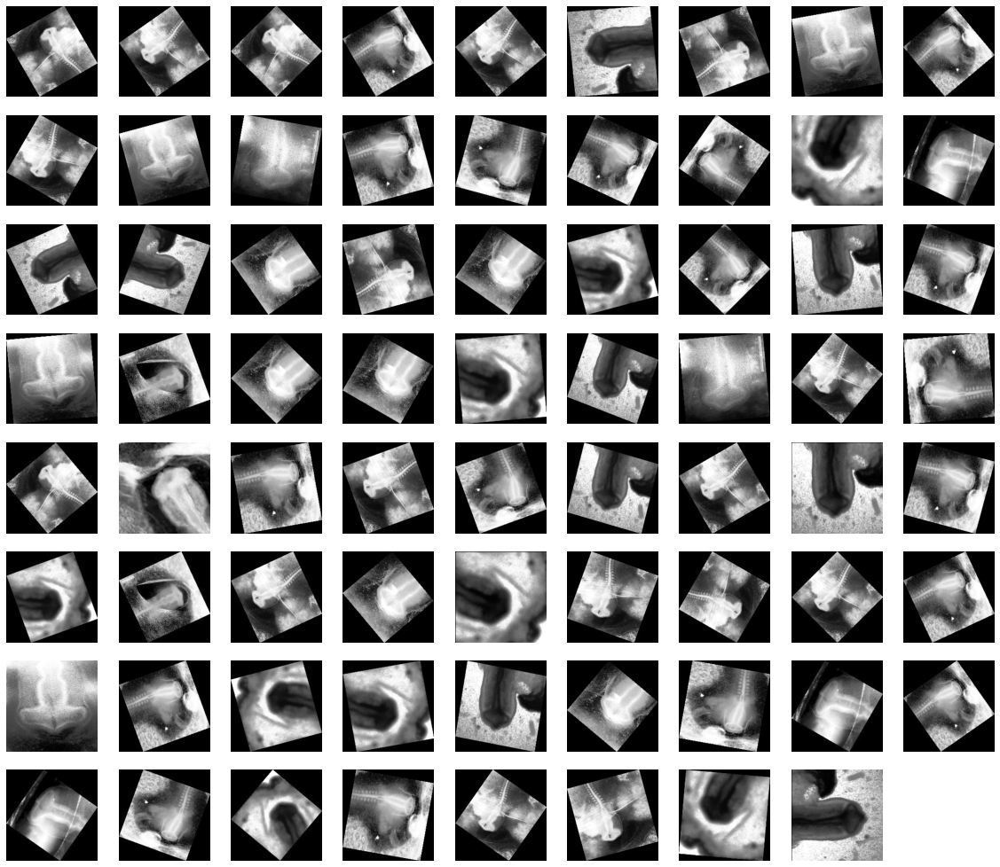

In [ ]:
fig = plt.figure(figsize=(20, 20))
results = model.predict(X_val)
nums = []
classes = []
for i in range(np.shape(X_val)[0]):
  nums.append(max(list(results[i])))
id = []
for num in nums:
  if num < 0.5:
    id.append(nums.index(num))
images = []
for i in id:
  images.append(valbad3[i][0])
  classes.append(np.where(y_val[i]==1))
for i in range(len(images)):
  plt.subplot((int(math.ceil(np.sqrt(len(id))))), 
              (int(math.ceil(np.sqrt(len(id))))), 
              i+1)
  plt.imshow(images[i], cmap = 'gray')
  plt.axis('off')
classes = np.concatenate(classes)
print('Number of 10.1s:', sum(classes == 0))
print('Number of 10.2s:', sum(classes == 1))
print('Number of 10.3s:', sum(classes == 2))
print('Percetage of 10.1s less than 0.5', sum(classes == 0)/sum(valclasses == 0))
print('Percetage of 10.2s less than 0.5', sum(classes == 1)/sum(valclasses == 1))
print('Percetage of 10.3s less than 0.5', sum(classes == 2)/sum(valclasses == 2))

Number of 10.1s: [63]
Number of 10.2s: [210]
Number of 10.3s: [282]
Percetage of 10.1s more than 0.9 [0.109375]
Percetage of 10.2s more than 0.9 [0.32407407]
Percetage of 10.3s more than 0.9 [0.65277778]


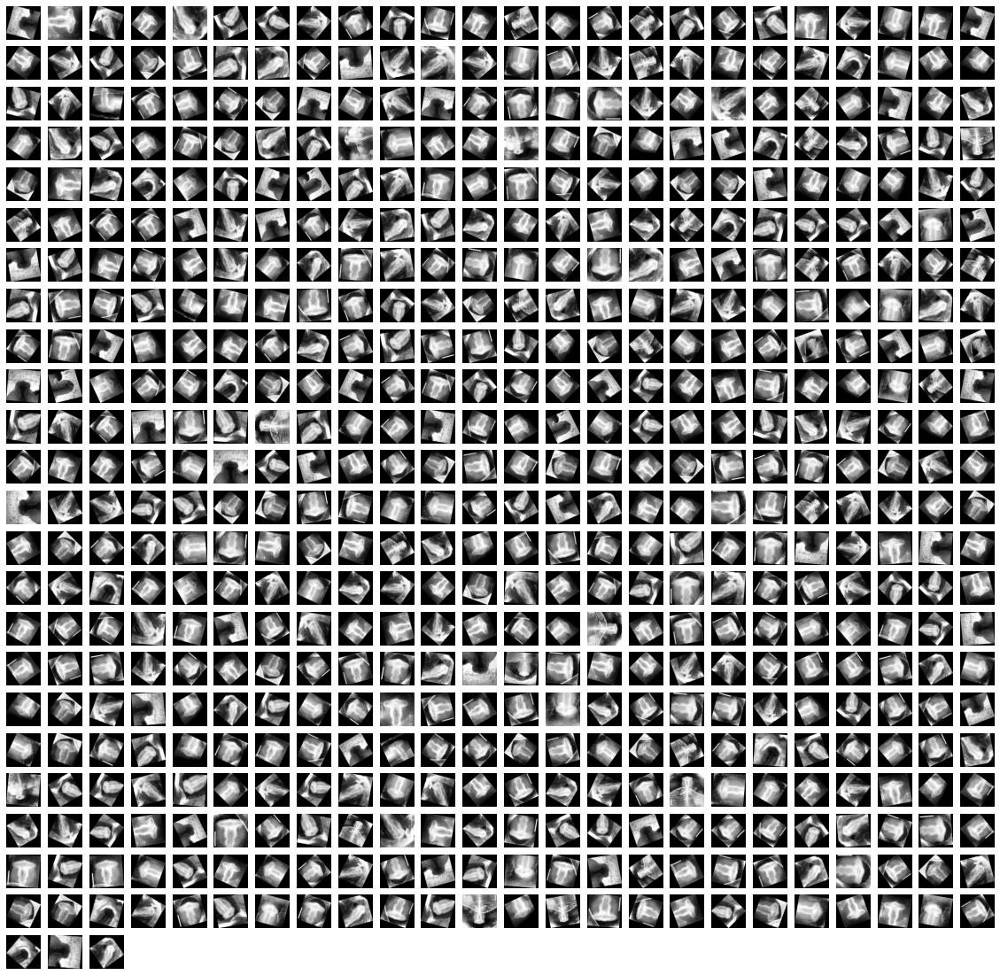

In [ ]:
fig = plt.figure(figsize=(20, 20))
results = model.predict(X_val)
nums = []
classes = []
for i in range(np.shape(X_val)[0]):
  nums.append(max(list(results[i])))
id = []
for num in nums:
  if num > 0.9:
    id.append(nums.index(num))
images = []
for i in id:
  images.append(valbad3[i][0])
  classes.append(np.where(y_val[i]==1))
for i in range(len(images)):
  plt.subplot((int(math.ceil(np.sqrt(len(id))))), 
              (int(math.ceil(np.sqrt(len(id))))), 
              i+1)
  plt.imshow(images[i], cmap = 'gray')
  plt.axis('off')
classes = np.concatenate(classes)
print('Number of 10.1s:', sum(classes == 0))
print('Number of 10.2s:', sum(classes == 1))
print('Number of 10.3s:', sum(classes == 2))
print('Percetage of 10.1s more than 0.9', sum(classes == 0)/sum(valclasses == 0))
print('Percetage of 10.2s more than 0.9', sum(classes == 1)/sum(valclasses == 1))
print('Percetage of 10.3s more than 0.9', sum(classes == 2)/sum(valclasses == 2))

## Less rotated images, normal and normalised hist images

In [ ]:
np.shape(training_data3)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


(8568, 2)

In [ ]:
np.shape(trainbad3)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


(8568, 2)

In [ ]:
train_large[15444][1]

0

In [ ]:
train_large = np.concatenate((training_data3, trainbad3), axis = 0)

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [ ]:
np.shape(train_large)

(17136, 2)

In [ ]:
val_large = np.concatenate((val_data3, valbad3), axis = 0)

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [ ]:
np.shape(val_large)

(3312, 2)

In [ ]:
# random.shuffle(train_large)
# random.shuffle(val_large)
# random.shuffle(test_data3)

# Preprocessing the data into X_train etc with relevant input shapes
X_train = []
y_train = []
X_val = []
y_val = []
X_test = []
y_test = []
img_size = 200

for feature, label in train_large:
  X_train.append(feature)
  y_train.append(label)

for feature, label in val_large:
  X_val.append(feature)
  y_val.append(label)

for feature, label in test_data3:
  X_test.append(feature)
  y_test.append(label)

X_train = np.array(X_train) / 255
X_val = np.array(X_val) / 255
X_test = np.array(X_test) / 255

X_train = X_train.reshape(X_train.shape[0], 200, 200, 1)
X_val = X_val.reshape(X_val.shape[0], 200, 200, 1)
X_test = X_test.reshape(X_test.shape[0], 200, 200, 1)

X_train.astype('float32')
X_val.astype('float32')
X_test.astype('float32')

y_train=to_categorical(y_train)
y_val=to_categorical(y_val)
y_test = to_categorical(y_test)

print('X_train shape:', np.shape(X_train))
print('X_val shape:', np.shape(X_val))
print('X_test shape:', np.shape(X_test))
print('y_train shape:', np.shape(y_train))
print('y_val shape:', np.shape(y_val))
print('y_test shape:', np.shape(y_test))

X_train shape: (17136, 200, 200, 1)
X_val shape: (3312, 200, 200, 1)
X_test shape: (9, 200, 200, 1)
y_train shape: (17136, 3)
y_val shape: (3312, 3)
y_test shape: (9, 3)


In [ ]:
trainclasses = []
for i in range(17136):
  trainclasses.append(np.where(y_train[i]==1))
trainclasses = np.concatenate(trainclasses)
print('Number of 10.1s:', sum(trainclasses == 0))
print('Number of 10.2s:', sum(trainclasses == 1))
print('Number of 10.3s:', sum(trainclasses == 2))

Number of 10.1s: [6192]
Number of 10.2s: [6192]
Number of 10.3s: [4752]


In [ ]:
valclasses = []
for i in range(3312):
  valclasses.append(np.where(y_val[i]==1))
valclasses = np.concatenate(valclasses)
print('Number of 10.1s:', sum(valclasses == 0))
print('Number of 10.2s:', sum(valclasses == 1))
print('Number of 10.3s:', sum(valclasses == 2))

Number of 10.1s: [1152]
Number of 10.2s: [1296]
Number of 10.3s: [864]


In [ ]:
model = create_model(optimizer = 'adam',
                      learning_rate = 0.0001,
                      layer_drop = 0.2,
                      final_drop = 0.5,
                      activation = 'relu',
                      lamda = 0.001)

earlyStop = EarlyStopping(monitor = 'val_loss', min_delta = 0.01, patience = 5)

# callbacks_list = [callback_log, earlyStop]

history3 = model.fit(x=X_train,
                    y=y_train,
                    epochs=50,
                    batch_size=32,
                    validation_data=(X_val, y_val),
                    callbacks=[earlyStop])

Epoch 1/50
536/536 [==============================] - 14s 24ms/step - loss: 1.4465 - accuracy: 0.4296 - val_loss: 1.3205 - val_accuracy: 0.4209
Epoch 2/50
536/536 [==============================] - 12s 23ms/step - loss: 1.1078 - accuracy: 0.6026 - val_loss: 1.2061 - val_accuracy: 0.5302
Epoch 3/50
536/536 [==============================] - 12s 23ms/step - loss: 0.7806 - accuracy: 0.7662 - val_loss: 0.9903 - val_accuracy: 0.6745
Epoch 4/50
536/536 [==============================] - 12s 23ms/step - loss: 0.5136 - accuracy: 0.8957 - val_loss: 0.9218 - val_accuracy: 0.7431
Epoch 5/50
536/536 [==============================] - 12s 23ms/step - loss: 0.3875 - accuracy: 0.9477 - val_loss: 0.9793 - val_accuracy: 0.7355
Epoch 6/50
536/536 [==============================] - 12s 23ms/step - loss: 0.3317 - accuracy: 0.9679 - val_loss: 0.9326 - val_accuracy: 0.7579
Epoch 7/50
536/536 [==============================] - 12s 23ms/step - loss: 0.2934 - accuracy: 0.9807 - val_loss: 0.9414 - val_accuracy:

In [ ]:
fig = plt.figure(figsize=(20, 20))
results = model.predict(X_val)
nums = []
classes = []
for i in range(np.shape(X_val)[0]):
  nums.append(max(list(results[i])))
id = []
for num in nums:
  if num < 0.5:
    id.append(nums.index(num))
images = []
for i in id:
  images.append(val_data3[i][0])
  classes.append(np.where(y_val[i]==1))
for i in range(len(images)):
  plt.subplot((int(math.ceil(np.sqrt(len(id))))), 
              (int(math.ceil(np.sqrt(len(id))))), 
              i+1)
  plt.imshow(images[i], cmap = 'gray')
  plt.axis('off')
classes = np.concatenate(classes)
print('Number of 10.1s:', sum(classes == 0))
print('Number of 10.2s:', sum(classes == 1))
print('Number of 10.3s:', sum(classes == 2))
print('Percetage of 10.1s less than 0.5', sum(classes == 0)/sum(valclasses == 0))
print('Percetage of 10.2s less than 0.5', sum(classes == 1)/sum(valclasses == 1))
print('Percetage of 10.3s less than 0.5', sum(classes == 2)/sum(valclasses == 2))

IndexError: ignored

<Figure size 1440x1440 with 0 Axes>

# kgjsdlkg

In [ ]:
random.shuffle(trainbad3)
random.shuffle(valbad3)
# random.shuffle(test_data3)

# Preprocessing the data into X_train etc with relevant input shapes
X_train = []
y_train = []
X_val = []
y_val = []
X_test = []
y_test = []
img_size = 200

for feature, label in trainbad3:
  X_train.append(feature)
  y_train.append(label)

for feature, label in valbad3:
  X_val.append(feature)
  y_val.append(label)

# for feature, label in test_data2:
#   X_test.append(feature)
#   y_test.append(label)

X_train = np.array(X_train) / 255
X_val = np.array(X_val) / 255
# X_test = np.array(X_test) / 255

X_train = X_train.reshape(X_train.shape[0], 200, 200, 1)
X_val = X_val.reshape(X_val.shape[0], 200, 200, 1)
# X_test = X_test.reshape(X_test.shape[0], 200, 200, 1)

X_train.astype('float32')
X_val.astype('float32')
# X_test.astype('float32')

y_train=to_categorical(y_train)
y_val=to_categorical(y_val)
# y_test = to_categorical(y_test)

print('X_train shape:', np.shape(X_train))
print('X_val shape:', np.shape(X_val))
print('X_test shape:', np.shape(X_test))
print('y_train shape:', np.shape(y_train))
print('y_val shape:', np.shape(y_val))
print('y_test shape:', np.shape(y_test))


X_train shape: (8568, 200, 200, 1)
X_val shape: (1656, 200, 200, 1)
X_test shape: (0,)
y_train shape: (8568, 3)
y_val shape: (1656, 3)
y_test shape: (0,)


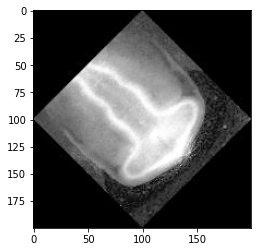

In [ ]:
plt.imshow(trainbad3[0][0], cmap = 'gray')

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras import regularizers
layer_drop = 0.2
final_drop = 0.5
activation = 'relu'
lamda = 0.0001
model = Sequential([
  layers.Conv2D(16, 3, padding='same', activation= activation, input_shape = (200, 200, 1), kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(32, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(64, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(128, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(256, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(512, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(1024, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Flatten(),
  layers.Dense(1024, activation=activation),
  layers.Dropout(final_drop),
  layers.Dense(3, activation = 'softmax')
])
#opt = Adam(learning_rate = learning_rate)
model.compile(optimizer = Adam(learning_rate = 0.0001),
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])

earlyStop = EarlyStopping(monitor = 'val_loss', min_delta = 0.01, patience = 5)

history = model.fit(x=X_train,
                    y=y_train,
                    epochs=50,
                    batch_size=32,
                    validation_data=(X_val, y_val))
 #                   callbacks=[earlyStop])

model.save(modelDIR + '/badsplit_model_layer_7_units_1024')

    # if callback.stopped_epoch < epochs:
    #   epochs_range = range(callback.stopped_epoch + 1)
    # else:
    #   epochs_range = range(epochs)

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
accuracy = history.history['val_accuracy'][-1]

epochs_range = range(50)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy = {}%'.format(round(max(acc), 1)))
plt.plot(epochs_range, val_acc, label='Validation Accuracy = {}%'.format(round(max(val_acc), 1)))
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss = {}%'.format(round(min(loss), 1)))
plt.plot(epochs_range, val_loss, label='Validation Loss = {}%'.format(round(min(val_loss), 1)))
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.figtext(0.425, 0.08, 'Training size = {}'.format(np.shape(X_train)[0]))
plt.figtext(0.425, 0.06, 'Validation size = {}'.format(np.shape(X_val)[0]))
plt.figtext(0.425, 0.04, 'Test accuracy = {}%'.format(round(test_acc*100, 1)))
plt.savefig(plotDIR + '/badsplit_model_layer_7_units_1024.png')
plt.show()

Epoch 1/50
268/268 [==============================] - 10s 34ms/step - loss: 1.2028 - accuracy: 0.3704 - val_loss: 1.1885 - val_accuracy: 0.3478
Epoch 2/50
268/268 [==============================] - 9s 32ms/step - loss: 1.0896 - accuracy: 0.4898 - val_loss: 1.1040 - val_accuracy: 0.5658
Epoch 3/50
268/268 [==============================] - 9s 32ms/step - loss: 0.9029 - accuracy: 0.6415 - val_loss: 1.0088 - val_accuracy: 0.5755
Epoch 4/50
268/268 [==============================] - 9s 32ms/step - loss: 0.5996 - accuracy: 0.7897 - val_loss: 0.8469 - val_accuracy: 0.6908
Epoch 5/50
268/268 [==============================] - 8s 32ms/step - loss: 0.3204 - accuracy: 0.9153 - val_loss: 0.7624 - val_accuracy: 0.7198
Epoch 6/50
268/268 [==============================] - 8s 32ms/step - loss: 0.2106 - accuracy: 0.9611 - val_loss: 0.6624 - val_accuracy: 0.7482
Epoch 7/50
268/268 [==============================] - 9s 32ms/step - loss: 0.1447 - accuracy: 0.9827 - val_loss: 0.6731 - val_accuracy: 0.744

KeyboardInterrupt: ignored

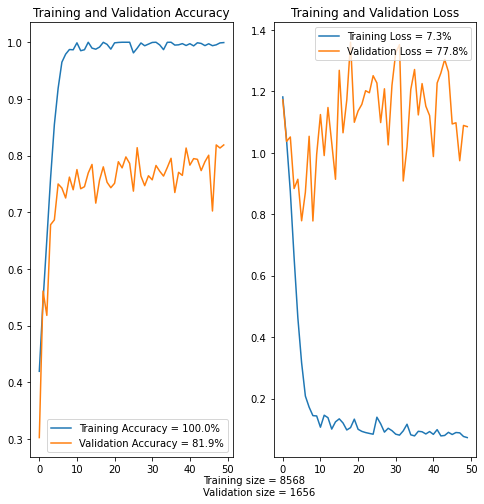

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
accuracy = history.history['val_accuracy'][-1]

epochs_range = range(50)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy = {}%'.format(round(max(acc)*100, 1)))
plt.plot(epochs_range, val_acc, label='Validation Accuracy = {}%'.format(round(max(val_acc)*100, 1)))
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss = {}%'.format(round(min(loss)*100, 1)))
plt.plot(epochs_range, val_loss, label='Validation Loss = {}%'.format(round(min(val_loss)*100, 1)))
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.figtext(0.425, 0.08, 'Training size = {}'.format(np.shape(X_train)[0]))
plt.figtext(0.425, 0.06, 'Validation size = {}'.format(np.shape(X_val)[0]))
plt.savefig(plotDIR + '/badsplit_model_layer_7_units_1024.png')
plt.show()

In [ ]:
random.shuffle(training_data3)
random.shuffle(val_data3)
# random.shuffle(test_data3)

# Preprocessing the data into X_train etc with relevant input shapes
X_train = []
y_train = []
X_val = []
y_val = []
X_test = []
y_test = []
img_size = 200

for feature, label in training_data3:
  X_train.append(feature)
  y_train.append(label)

for feature, label in val_data3:
  X_val.append(feature)
  y_val.append(label)

# for feature, label in test_data2:
#   X_test.append(feature)
#   y_test.append(label)

X_train = np.array(X_train) / 255
X_val = np.array(X_val) / 255
# X_test = np.array(X_test) / 255

X_train = X_train.reshape(X_train.shape[0], 200, 200, 1)
X_val = X_val.reshape(X_val.shape[0], 200, 200, 1)
# X_test = X_test.reshape(X_test.shape[0], 200, 200, 1)

X_train.astype('float32')
X_val.astype('float32')
# X_test.astype('float32')

y_train=to_categorical(y_train)
y_val=to_categorical(y_val)
# y_test = to_categorical(y_test)

print('X_train shape:', np.shape(X_train))
print('X_val shape:', np.shape(X_val))
print('X_test shape:', np.shape(X_test))
print('y_train shape:', np.shape(y_train))
print('y_val shape:', np.shape(y_val))
print('y_test shape:', np.shape(y_test))


X_train shape: (8568, 200, 200, 1)
X_val shape: (1656, 200, 200, 1)
X_test shape: (0,)
y_train shape: (8568, 3)
y_val shape: (1656, 3)
y_test shape: (0,)


Epoch 1/50
268/268 [==============================] - 10s 33ms/step - loss: 1.1787 - accuracy: 0.4163 - val_loss: 1.1676 - val_accuracy: 0.4040
Epoch 2/50
268/268 [==============================] - 8s 31ms/step - loss: 1.0347 - accuracy: 0.5621 - val_loss: 1.1197 - val_accuracy: 0.4191
Epoch 3/50
268/268 [==============================] - 8s 31ms/step - loss: 0.8404 - accuracy: 0.6712 - val_loss: 0.9701 - val_accuracy: 0.5664
Epoch 4/50
268/268 [==============================] - 8s 32ms/step - loss: 0.6147 - accuracy: 0.7841 - val_loss: 0.8875 - val_accuracy: 0.6431
Epoch 5/50
268/268 [==============================] - 8s 31ms/step - loss: 0.3926 - accuracy: 0.8822 - val_loss: 0.9700 - val_accuracy: 0.6806
Epoch 6/50
268/268 [==============================] - 8s 31ms/step - loss: 0.2463 - accuracy: 0.9490 - val_loss: 0.7944 - val_accuracy: 0.7500
Epoch 7/50
268/268 [==============================] - 8s 32ms/step - loss: 0.1880 - accuracy: 0.9721 - val_loss: 1.0071 - val_accuracy: 0.740

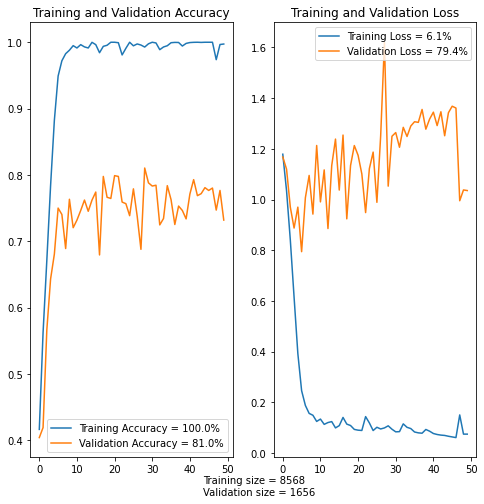

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras import regularizers
layer_drop = 0.2
final_drop = 0.5
activation = 'relu'
lamda = 0.0001
model = Sequential([
  layers.Conv2D(16, 3, padding='same', activation= activation, input_shape = (200, 200, 1), kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(32, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(64, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(128, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(256, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(512, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(1024, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Flatten(),
  layers.Dense(1024, activation=activation),
  layers.Dropout(final_drop),
  layers.Dense(3, activation = 'softmax')
])
#opt = Adam(learning_rate = learning_rate)
model.compile(optimizer = Adam(learning_rate = 0.0001),
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])

earlyStop = EarlyStopping(monitor = 'val_loss', min_delta = 0.01, patience = 5)

history = model.fit(x=X_train,
                    y=y_train,
                    epochs=50,
                    batch_size=32,
                    validation_data=(X_val, y_val))
 #                   callbacks=[earlyStop])

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
accuracy = history.history['val_accuracy'][-1]

epochs_range = range(50)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy = {}%'.format(round(max(acc)*100, 1)))
plt.plot(epochs_range, val_acc, label='Validation Accuracy = {}%'.format(round(max(val_acc)*100, 1)))
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss = {}%'.format(round(min(loss)*100, 1)))
plt.plot(epochs_range, val_loss, label='Validation Loss = {}%'.format(round(min(val_loss)*100, 1)))
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.figtext(0.425, 0.08, 'Training size = {}'.format(np.shape(X_train)[0]))
plt.figtext(0.425, 0.06, 'Validation size = {}'.format(np.shape(X_val)[0]))
plt.savefig(plotDIR + '/badsplit_histeq_no_model_layer_7_units_1024.png')
plt.show()

# Badsplit 1 revisited

In [ ]:
import zipfile
!unzip '/content/opt_12_08_2021__09_05_38.zip'

Streaming output truncated to the last 5000 lines.
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate32010.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate28010.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate30010.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate29510.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate30510.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate28510.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate33010.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate31510.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate27510.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate26510.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate24010.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate24510.3_027.jpg  
  inflating: opt_12_08_2021__09_05_38/train/10_3/rotate26010.3_027.jpg  


In [ ]:
training_data2 = create_training_data('opt_12_08_2021__09_05_38/train', train = True)
val_data2 = create_training_data('opt_12_08_2021__09_05_38/val', val = True)
# test_data2 = create_training_data(path + '/test', test = True)

100%|██████████| 432/432 [00:01<00:00, 276.26it/s]


In [ ]:
random.shuffle(training_data2)
random.shuffle(val_data2)
# random.shuffle(test_data3)

# Preprocessing the data into X_train etc with relevant input shapes
X_train = []
y_train = []
X_val = []
y_val = []
X_test = []
y_test = []
img_size = 200

for feature, label in training_data2:
  X_train.append(feature)
  y_train.append(label)

for feature, label in val_data2:
  X_val.append(feature)
  y_val.append(label)

# for feature, label in test_data2:
#   X_test.append(feature)
#   y_test.append(label)

X_train = np.array(X_train) / 255
X_val = np.array(X_val) / 255
# X_test = np.array(X_test) / 255

X_train = X_train.reshape(X_train.shape[0], 200, 200, 1)
X_val = X_val.reshape(X_val.shape[0], 200, 200, 1)
# X_test = X_test.reshape(X_test.shape[0], 200, 200, 1)

X_train.astype('float32')
X_val.astype('float32')
# X_test.astype('float32')

y_train=to_categorical(y_train)
y_val=to_categorical(y_val)
# y_test = to_categorical(y_test)

print('X_train shape:', np.shape(X_train))
print('X_val shape:', np.shape(X_val))
print('X_test shape:', np.shape(X_test))
print('y_train shape:', np.shape(y_train))
print('y_val shape:', np.shape(y_val))
print('y_test shape:', np.shape(y_test))


In [ ]:
from tensorflow.keras import layers
from tensorflow.keras import regularizers
layer_drop = 0.2
final_drop = 0.5
activation = 'relu'
lamda = 0.0001
model = Sequential([
  layers.Conv2D(16, 3, padding='same', activation= activation, input_shape = (200, 200, 1), kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(32, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(64, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(128, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(256, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(512, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(1024, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Flatten(),
  layers.Dense(1024, activation=activation),
  layers.Dropout(final_drop),
  layers.Dense(3, activation = 'softmax')
])
#opt = Adam(learning_rate = learning_rate)
model.compile(optimizer = Adam(learning_rate = 0.0001),
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])

earlyStop = EarlyStopping(monitor = 'val_loss', min_delta = 0.01, patience = 5)

history = model.fit(x=X_train,
                    y=y_train,
                    epochs=50,
                    batch_size=32,
                    validation_data=(X_val, y_val))
 #                   callbacks=[earlyStop])

model.save(modelDIR + '/badsplit_50')

    # if callback.stopped_epoch < epochs:
    #   epochs_range = range(callback.stopped_epoch + 1)
    # else:
    #   epochs_range = range(epochs)

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
accuracy = history.history['val_accuracy'][-1]

epochs_range = range(50)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy = {}%'.format(round(max(acc), 1)))
plt.plot(epochs_range, val_acc, label='Validation Accuracy = {}%'.format(round(max(val_acc), 1)))
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss = {}%'.format(round(min(loss), 1)))
plt.plot(epochs_range, val_loss, label='Validation Loss = {}%'.format(round(min(val_loss), 1)))
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.figtext(0.425, 0.08, 'Training size = {}'.format(np.shape(X_train)[0]))
plt.figtext(0.425, 0.06, 'Validation size = {}'.format(np.shape(X_val)[0]))
plt.figtext(0.425, 0.04, 'Test accuracy = {}%'.format(round(test_acc*100, 1)))
plt.savefig(plotDIR + '/badsplit_50.png')
plt.show()

In [ ]:
trainbad3 = []
for feature, label in training_data3:
  feature = cv2.equalizeHist(feature)
  trainbad3.append([feature, label])  

valbad3 = []
for feature, label in val_data3:
  feature = cv2.equalizeHist(feature)
  valbad3.append([feature, label]) 

In [ ]:
random.shuffle(trainbad3)
random.shuffle(valbad3)
# random.shuffle(test_data3)

# Preprocessing the data into X_train etc with relevant input shapes
X_train = []
y_train = []
X_val = []
y_val = []
X_test = []
y_test = []
img_size = 200

for feature, label in trainbad3:
  X_train.append(feature)
  y_train.append(label)

for feature, label in valbad3:
  X_val.append(feature)
  y_val.append(label)

# for feature, label in test_data2:
#   X_test.append(feature)
#   y_test.append(label)

X_train = np.array(X_train) / 255
X_val = np.array(X_val) / 255
# X_test = np.array(X_test) / 255

X_train = X_train.reshape(X_train.shape[0], 200, 200, 1)
X_val = X_val.reshape(X_val.shape[0], 200, 200, 1)
# X_test = X_test.reshape(X_test.shape[0], 200, 200, 1)

X_train.astype('float32')
X_val.astype('float32')
# X_test.astype('float32')

y_train=to_categorical(y_train)
y_val=to_categorical(y_val)
# y_test = to_categorical(y_test)

print('X_train shape:', np.shape(X_train))
print('X_val shape:', np.shape(X_val))
print('X_test shape:', np.shape(X_test))
print('y_train shape:', np.shape(y_train))
print('y_val shape:', np.shape(y_val))
print('y_test shape:', np.shape(y_test))


In [ ]:
from tensorflow.keras import layers
from tensorflow.keras import regularizers
layer_drop = 0.2
final_drop = 0.5
activation = 'relu'
lamda = 0.0001
model = Sequential([
  layers.Conv2D(16, 3, padding='same', activation= activation, input_shape = (200, 200, 1), kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(32, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(64, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(128, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(256, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(512, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Conv2D(1024, 3, padding='same', activation=activation, kernel_regularizer=regularizers.l2(lamda)),
  layers.Dropout(layer_drop),
  layers.MaxPooling2D((2,2), padding='same'),
  layers.Flatten(),
  layers.Dense(1024, activation=activation),
  layers.Dropout(final_drop),
  layers.Dense(3, activation = 'softmax')
])
#opt = Adam(learning_rate = learning_rate)
model.compile(optimizer = Adam(learning_rate = 0.0001),
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])

earlyStop = EarlyStopping(monitor = 'val_loss', min_delta = 0.01, patience = 5)

history = model.fit(x=X_train,
                    y=y_train,
                    epochs=50,
                    batch_size=32,
                    validation_data=(X_val, y_val))
 #                   callbacks=[earlyStop])

model.save(modelDIR + '/badsplit_model_layer_7_units_1024')

    # if callback.stopped_epoch < epochs:
    #   epochs_range = range(callback.stopped_epoch + 1)
    # else:
    #   epochs_range = range(epochs)

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
accuracy = history.history['val_accuracy'][-1]

epochs_range = range(50)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy = {}%'.format(round(max(acc), 1)))
plt.plot(epochs_range, val_acc, label='Validation Accuracy = {}%'.format(round(max(val_acc), 1)))
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss = {}%'.format(round(min(loss), 1)))
plt.plot(epochs_range, val_loss, label='Validation Loss = {}%'.format(round(min(val_loss), 1)))
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.figtext(0.425, 0.08, 'Training size = {}'.format(np.shape(X_train)[0]))
plt.figtext(0.425, 0.06, 'Validation size = {}'.format(np.shape(X_val)[0]))
plt.figtext(0.425, 0.04, 'Test accuracy = {}%'.format(round(test_acc*100, 1)))
plt.savefig(plotDIR + '/badsplit_model_layer_7_units_1024.png')
plt.show()